In [2]:
# For sending GET requests from the API
import requests
# For saving access tokens and for file management when creating and adding to the dataset
import os
# For dealing with json responses we receive from the API
import json
# For displaying the data after
import pandas as pd
# For saving the response data in CSV format
import csv
# For parsing the dates received from twitter in readable formats
import datetime
import dateutil.parser
import unicodedata
#To add wait time between requests
import time

In [36]:
#input your token here
os.environ['TOKEN'] = "AAAAAAAAAAAAAAAAAAAAAN3ragEAAAAA2jfyUGcgSX8Lq71Eoj4%2Ba3dUP8o%3DWGfP6veN0uKshFlJsrpx2HUAQ9cWIwy3l3rK9a4UpPSGqPhyym"

In [38]:
#after every request, we want to retrieve the token again to keep going on
def auth():
    return os.getenv('TOKEN')

In [39]:
#Need to get data for 2.5 years!
#Focus on the following hashtags and keywords = CAA_NRC (DONE), CAA_NRC_NPR (DONE), CAAProtests (DONE), IndiaAgainstCAA (DONE), BoycottNRC, NoCAA (D0NE), NoNRC (DONE)
# Use the following too: delhipogrom (DONE), northeastdelhiriots (DONE), standwithjamia (DONE), standwithshaheenbagh (DONE), shaheenbaghprotests (DONE)
#Then CLEANING of that data


In [40]:
#function to create headers which authorize our requests
def create_headers(bearer_token):
    headers = {"Authorization": "Bearer {}".format(bearer_token)}
    return headers

In [41]:
#create urls to run our search

def create_url(keyword, start_date, end_date, max_results = 10):
    
    search_url = "https://api.twitter.com/2/tweets/search/all" #Change to the endpoint you want to collect data from

    #change params based on the endpoint you are using
    query_params = {'query': keyword,
                    'start_time': start_date,
                    'end_time': end_date,
                    'max_results': max_results,
                    'expansions': 'author_id,in_reply_to_user_id,geo.place_id',
                    'tweet.fields': 'id,text,author_id,in_reply_to_user_id,geo,conversation_id,created_at,lang,public_metrics,referenced_tweets,reply_settings,source',
                    'user.fields': 'id,name,username,created_at,description,public_metrics,verified',
                    'place.fields': 'full_name,id,country,country_code,geo,name,place_type',
                    'next_token': {"'b26v89c19zqg8o3fosqtyj5svl07ptctnkv04fcrjsqd9'"}}
    return (search_url, query_params)

In [42]:
#function to end our search
def connect_to_endpoint(url, headers, params, next_token = None):
    params['next_token'] = next_token   #params object received from create_url function
    response = requests.request("GET", url, headers = headers, params = params)
    print("Endpoint Response Code: " + str(response.status_code))
    if response.status_code != 200:
        raise Exception(response.status_code, response.text)
    return response.json()

In [43]:
#Inputs for the request
bearer_token = auth()
headers = create_headers(bearer_token)
keyword = "#caaprotests"
start_time = "2019-12-11T00:00:00.000Z"
end_time = "2022-09-11T00:00:00.000Z"
max_results = 500

In [44]:
url = create_url(keyword, start_time,end_time, max_results)
json_response = connect_to_endpoint(url[0], headers, url[1])

Endpoint Response Code: 200


In [45]:
print(json.dumps(json_response, indent=4, sort_keys=True))

{
    "data": [
        {
            "author_id": "1530068954903097344",
            "conversation_id": "1567462778184802305",
            "created_at": "2022-09-07T10:40:23.000Z",
            "id": "1567462778184802305",
            "lang": "en",
            "public_metrics": {
                "like_count": 0,
                "quote_count": 0,
                "reply_count": 0,
                "retweet_count": 3
            },
            "referenced_tweets": [
                {
                    "id": "1215464826534678528",
                    "type": "retweeted"
                }
            ],
            "reply_settings": "everyone",
            "source": "Twitter Web App",
            "text": "RT @MeghanaSastry: A #student holds a #Peace symbol outside #JNC during a #ProtestsAgainstCAA which is an aftermath of last evening's incid\u2026"
        },
        {
            "author_id": "707889352",
            "conversation_id": "1566265420339990529",
            "created_at": "20

In [46]:
json_response['data']

[{'lang': 'en',
  'author_id': '1530068954903097344',
  'created_at': '2022-09-07T10:40:23.000Z',
  'text': "RT @MeghanaSastry: A #student holds a #Peace symbol outside #JNC during a #ProtestsAgainstCAA which is an aftermath of last evening's incid…",
  'public_metrics': {'retweet_count': 3,
   'reply_count': 0,
   'like_count': 0,
   'quote_count': 0},
  'source': 'Twitter Web App',
  'reply_settings': 'everyone',
  'id': '1567462778184802305',
  'conversation_id': '1567462778184802305',
  'referenced_tweets': [{'type': 'retweeted', 'id': '1215464826534678528'}]},
 {'lang': 'en',
  'author_id': '707889352',
  'created_at': '2022-09-04T03:22:30.000Z',
  'text': 'RT @rose_k01: SEE CLEVERNESS of Arfa Khanum @khanumarfa to fool &amp; get support of Non MusIims for #CAAProtests "Till we become an "IDEAL SOC…',
  'public_metrics': {'retweet_count': 696,
   'reply_count': 0,
   'like_count': 0,
   'quote_count': 0},
  'source': 'Twitter Web App',
  'reply_settings': 'everyone',
  'id': '1566

In [47]:
json_response['meta']['result_count']

#473 tweets retrieved in this round

465

In [48]:
outpath = "C:\\Users\\anush\\Desktop\\McGill\\Dissertation\\Twitter scrape for thesis\\Test code\\Output for test scrape\\"

with open(outpath + 'test_16sep.json', 'w') as f:
    json.dump(json_response, f)

In [49]:
json_response

{'data': [{'lang': 'en',
   'author_id': '1530068954903097344',
   'created_at': '2022-09-07T10:40:23.000Z',
   'text': "RT @MeghanaSastry: A #student holds a #Peace symbol outside #JNC during a #ProtestsAgainstCAA which is an aftermath of last evening's incid…",
   'public_metrics': {'retweet_count': 3,
    'reply_count': 0,
    'like_count': 0,
    'quote_count': 0},
   'source': 'Twitter Web App',
   'reply_settings': 'everyone',
   'id': '1567462778184802305',
   'conversation_id': '1567462778184802305',
   'referenced_tweets': [{'type': 'retweeted', 'id': '1215464826534678528'}]},
  {'lang': 'en',
   'author_id': '707889352',
   'created_at': '2022-09-04T03:22:30.000Z',
   'text': 'RT @rose_k01: SEE CLEVERNESS of Arfa Khanum @khanumarfa to fool &amp; get support of Non MusIims for #CAAProtests "Till we become an "IDEAL SOC…',
   'public_metrics': {'retweet_count': 696,
    'reply_count': 0,
    'like_count': 0,
    'quote_count': 0},
   'source': 'Twitter Web App',
   'reply_setti

In [15]:

# Create file
csvFile = open(outpath + "test_16sep.csv", "a", newline="", encoding='utf-8')
csvWriter = csv.writer(csvFile)

#Create headers for the data you want to save, in this example, we only want save these columns in our dataset
csvWriter.writerow(['author id', 'created_at', 'geo', 'id','lang', 'like_count', 'quote_count', 'reply_count','retweet_count','source','tweet'])
csvFile.close()

In [50]:

def append_to_csv(json_response, fileName):

    #A counter variable
    counter = 0

    #Open OR create the target CSV file
    csvFile = open(fileName, "a", newline="", encoding='utf-8')
    csvWriter = csv.writer(csvFile)

    #Loop through each tweet
    for tweet in json_response['data']:
        
        # We will create a variable for each since some of the keys might not exist for some tweets
        # So we will account for that

        # 1. Author ID
        author_id = tweet['author_id']

        # 2. Time created
        created_at = dateutil.parser.parse(tweet['created_at'])

        # 3. Geolocation
        if ('geo' in tweet):   
            geo = tweet['geo']['place_id']
        else:
            geo = " "

        # 4. Tweet ID
        tweet_id = tweet['id']

        # 5. Language
        lang = tweet['lang']

        # 6. Tweet metrics
        retweet_count = tweet['public_metrics']['retweet_count']
        reply_count = tweet['public_metrics']['reply_count']
        like_count = tweet['public_metrics']['like_count']
        quote_count = tweet['public_metrics']['quote_count']

        # 7. source
        source = tweet['source']

        # 8. Tweet text
        text = tweet['text']
        
        # Assemble all data in a list
        res = [author_id, created_at, geo, tweet_id, lang, like_count, quote_count, reply_count, retweet_count, source, text]
        
        # Append the result to the CSV file
        csvWriter.writerow(res)
        counter += 1

    # When done, close the CSV file
    csvFile.close()

    # Print the number of tweets for this iteration
    print("# of Tweets added from this response: ", counter) 

In [17]:
append_to_csv(json_response, "test_16sep.csv")

# of Tweets added from this response:  473


In [18]:
json_response

{'data': [{'referenced_tweets': [{'type': 'retweeted',
     'id': '1215464826534678528'}],
   'text': "RT @MeghanaSastry: A #student holds a #Peace symbol outside #JNC during a #ProtestsAgainstCAA which is an aftermath of last evening's incid…",
   'reply_settings': 'everyone',
   'author_id': '1530068954903097344',
   'conversation_id': '1567462778184802305',
   'public_metrics': {'retweet_count': 3,
    'reply_count': 0,
    'like_count': 0,
    'quote_count': 0},
   'lang': 'en',
   'id': '1567462778184802305',
   'source': 'Twitter Web App',
   'created_at': '2022-09-07T10:40:23.000Z'},
  {'referenced_tweets': [{'type': 'retweeted', 'id': '1221380095320956930'}],
   'text': 'RT @rose_k01: SEE CLEVERNESS of Arfa Khanum @khanumarfa to fool &amp; get support of Non MusIims for #CAAProtests "Till we become an "IDEAL SOC…',
   'reply_settings': 'everyone',
   'author_id': '707889352',
   'conversation_id': '1566265420339990529',
   'public_metrics': {'retweet_count': 697,
    'reply_cou

In [20]:
#imp: repeat this bit of code before converting into a dataframe for all relevant keywords

outpath = "C:\\Users\\anush\\Desktop\\McGill\\Dissertation\\Twitter scrape for thesis\\Test code\\Output for test scrape\\"
#Inputs for tweets
#almost 1 year of scrape so it should have a lot of tweets
bearer_token = auth()
headers = create_headers(bearer_token)
keyword = '#CAAProtests -is:retweet -is:reply'
start_list =    ['2019-12-11T00:00:00.000Z',
                 '2020-01-12T00:00:00.000Z',
                 '2020-02-13T00:00:00.000Z',
                 '2020-03-14T00:00:00.000Z',
                 '2020-04-15T00:00:00.000Z',
                 '2020-05-16T00:00:00.000Z',
                 '2020-06-17T00:00:00.000Z',
                 '2020-07-18T00:00:00.000Z',
                 '2020-08-19T00:00:00.000Z',
                 '2020-09-20T00:00:00.000Z',
                 '2020-10-21T00:00:00.000Z',
                 '2020-11-22T00:00:00.000Z',
                 '2020-12-23T00:00:00.000Z',
                 '2021-01-24T00:00:00.000Z',
                 '2021-02-25T00:00:00.000Z',
                 '2021-03-26T00:00:00.000Z',
                 '2021-04-27T00:00:00.000Z',
                 '2021-05-28T00:00:00.000Z',
                 '2021-06-29T00:00:00.000Z',
                 '2021-07-30T00:00:00.000Z',
                 '2021-08-31T00:00:00.000Z',
                 '2021-09-01T00:00:00.000Z',
                 '2021-10-02T00:00:00.000Z',
                 '2021-11-03T00:00:00.000Z',
                 '2021-12-04T00:00:00.000Z']

end_list =      ['2020-01-11T00:00:00.000Z',
                 '2020-02-12T00:00:00.000Z',
                 '2020-03-13T00:00:00.000Z',
                 '2020-04-14T00:00:00.000Z',
                 '2020-05-15T00:00:00.000Z',
                 '2020-06-16T00:00:00.000Z',
                 '2020-07-17T00:00:00.000Z',
                 '2020-08-18T00:00:00.000Z',
                 '2020-09-19T00:00:00.000Z',
                 '2020-10-20T00:00:00.000Z',
                 '2020-11-21T00:00:00.000Z',
                 '2020-12-22T00:00:00.000Z',
                 '2021-01-23T00:00:00.000Z',
                 '2021-02-24T00:00:00.000Z',
                 '2021-03-25T00:00:00.000Z',
                 '2021-04-26T00:00:00.000Z',
                 '2021-05-27T00:00:00.000Z',
                 '2021-06-28T00:00:00.000Z',
                 '2021-07-29T00:00:00.000Z',
                 '2021-08-30T00:00:00.000Z',
                 '2021-09-30T00:00:00.000Z',
                 '2021-10-01T00:00:00.000Z',
                 '2021-11-02T00:00:00.000Z',
                 '2021-12-03T00:00:00.000Z',
                 '2022-01-04T00:00:00.000Z']
max_results = 500

#Total number of tweets we collected from the loop
total_tweets = 0

# Create file
csvFile = open(outpath + "Allkeyworddata.csv", "a", newline="", encoding='utf-8')
csvWriter = csv.writer(csvFile)

#Create headers for the data you want to save, in this example, we only want save these columns in our dataset
csvWriter.writerow(['author id', 'created_at', 'geo', 'id','lang', 'like_count', 'quote_count', 'reply_count','retweet_count','source','tweet'])
csvFile.close()

for i in range(0,len(start_list)):

    # Inputs
    count = 0 # Counting tweets per time period
    max_count = 500 # Max tweets per time period
    flag = True
    next_token = None
    
    # Check if flag is true
    while flag:
        # Check if max_count reached
        if count >= max_count:
            break
        print("-------------------")
        print("Token: ", next_token)
        url = create_url(keyword, start_list[i],end_list[i], max_results)
        json_response = connect_to_endpoint(url[0], headers, url[1], next_token)
        result_count = json_response['meta']['result_count']

        if 'next_token' in json_response['meta']:
            # Save the token to use for next call
            next_token = json_response['meta']['next_token']
            print("Next Token: ", next_token)
            if result_count is not None and result_count > 0 and next_token is not None:
                print("Start Date: ", start_list[i])
                append_to_csv(json_response, outpath + "Allkeyworddata.csv")
                count += result_count
                total_tweets += result_count
                print("Total # of Tweets added: ", total_tweets)
                print("-------------------")
                time.sleep(5)                
        # If no next token exists
        else:
            if result_count is not None and result_count > 0:
                print("-------------------")
                print("Start Date: ", start_list[i])
                append_to_csv(json_response, outpath + "Allkeyworddata.csv")
                count += result_count
                total_tweets += result_count
                print("Total # of Tweets added: ", total_tweets)
                print("-------------------")
                time.sleep(5)
            
            #Since this is the final request, turn flag to false to move to the next time period.
            flag = False
            next_token = None
        time.sleep(5)
print("Total number of results: ", total_tweets)

-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo6yg57ivhdkedc3v47pal8tpypabh
Start Date:  2019-12-11T00:00:00.000Z
# of Tweets added from this response:  478
Total # of Tweets added:  478
-------------------
-------------------
Token:  b26v89c19zqg8o3fo6yg57ivhdkedc3v47pal8tpypabh
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo6yg5143r5agd6k3rdeadgffmayrh
Start Date:  2019-12-11T00:00:00.000Z
# of Tweets added from this response:  482
Total # of Tweets added:  960
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo71fx7rfowfy24pusaswopy9sagl9
Start Date:  2020-01-12T00:00:00.000Z
# of Tweets added from this response:  462
Total # of Tweets added:  1422
-------------------
-------------------
Token:  b26v89c19zqg8o3fo71fx7rfowfy24pusaswopy9sagl9
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo71fhxy4pl2dww2of2wormdaq7725
Start Date:  2020-01-12T00:00:00.000Z
# of T

In [22]:
#Scrape for next keyword: IndiaAgainstCAA or IndiaAgainstNRC

#imp: repeat this bit of code before converting into a dataframe for all relevant keywords

outpath = "C:\\Users\\anush\\Desktop\\McGill\\Dissertation\\Twitter scrape for thesis\\Test code\\Output for test scrape\\"
#Inputs for tweets
#almost 1 year of scrape so it should have a lot of tweets
bearer_token = auth()
headers = create_headers(bearer_token)
keyword = 'IndiaAgainstCAA OR IndiaAgainstNRC -is:retweet -is:reply'
start_list =    ['2019-12-11T00:00:00.000Z',
                 '2020-01-12T00:00:00.000Z',
                 '2020-02-13T00:00:00.000Z',
                 '2020-03-14T00:00:00.000Z',
                 '2020-04-15T00:00:00.000Z',
                 '2020-05-16T00:00:00.000Z',
                 '2020-06-17T00:00:00.000Z',
                 '2020-07-18T00:00:00.000Z',
                 '2020-08-19T00:00:00.000Z',
                 '2020-09-20T00:00:00.000Z',
                 '2020-10-21T00:00:00.000Z',
                 '2020-11-22T00:00:00.000Z',
                 '2020-12-23T00:00:00.000Z',
                 '2021-01-24T00:00:00.000Z',
                 '2021-02-25T00:00:00.000Z',
                 '2021-03-26T00:00:00.000Z',
                 '2021-04-27T00:00:00.000Z',
                 '2021-05-28T00:00:00.000Z',
                 '2021-06-29T00:00:00.000Z',
                 '2021-07-30T00:00:00.000Z',
                 '2021-08-31T00:00:00.000Z',
                 '2021-09-01T00:00:00.000Z',
                 '2021-10-02T00:00:00.000Z',
                 '2021-11-03T00:00:00.000Z',
                 '2021-12-04T00:00:00.000Z']

end_list =      ['2020-01-11T00:00:00.000Z',
                 '2020-02-12T00:00:00.000Z',
                 '2020-03-13T00:00:00.000Z',
                 '2020-04-14T00:00:00.000Z',
                 '2020-05-15T00:00:00.000Z',
                 '2020-06-16T00:00:00.000Z',
                 '2020-07-17T00:00:00.000Z',
                 '2020-08-18T00:00:00.000Z',
                 '2020-09-19T00:00:00.000Z',
                 '2020-10-20T00:00:00.000Z',
                 '2020-11-21T00:00:00.000Z',
                 '2020-12-22T00:00:00.000Z',
                 '2021-01-23T00:00:00.000Z',
                 '2021-02-24T00:00:00.000Z',
                 '2021-03-25T00:00:00.000Z',
                 '2021-04-26T00:00:00.000Z',
                 '2021-05-27T00:00:00.000Z',
                 '2021-06-28T00:00:00.000Z',
                 '2021-07-29T00:00:00.000Z',
                 '2021-08-30T00:00:00.000Z',
                 '2021-09-30T00:00:00.000Z',
                 '2021-10-01T00:00:00.000Z',
                 '2021-11-02T00:00:00.000Z',
                 '2021-12-03T00:00:00.000Z',
                 '2022-01-04T00:00:00.000Z']
max_results = 500

#Total number of tweets we collected from the loop
total_tweets = 0

# Create file
csvFile = open(outpath + "Allkeyworddata.csv", "a", newline="", encoding='utf-8')
csvWriter = csv.writer(csvFile)

#Create headers for the data you want to save, in this example, we only want save these columns in our dataset
csvWriter.writerow(['author id', 'created_at', 'geo', 'id','lang', 'like_count', 'quote_count', 'reply_count','retweet_count','source','tweet'])
csvFile.close()

for i in range(0,len(start_list)):

    # Inputs
    count = 0 # Counting tweets per time period
    max_count = 500 # Max tweets per time period
    flag = True
    next_token = None
    
    # Check if flag is true
    while flag:
        # Check if max_count reached
        if count >= max_count:
            break
        print("-------------------")
        print("Token: ", next_token)
        url = create_url(keyword, start_list[i],end_list[i], max_results)
        json_response = connect_to_endpoint(url[0], headers, url[1], next_token)
        result_count = json_response['meta']['result_count']

        if 'next_token' in json_response['meta']:
            # Save the token to use for next call
            next_token = json_response['meta']['next_token']
            print("Next Token: ", next_token)
            if result_count is not None and result_count > 0 and next_token is not None:
                print("Start Date: ", start_list[i])
                append_to_csv(json_response, outpath + "Allkeyworddata.csv")
                count += result_count
                total_tweets += result_count
                print("Total # of Tweets added: ", total_tweets)
                print("-------------------")
                time.sleep(5)                
        # If no next token exists
        else:
            if result_count is not None and result_count > 0:
                print("-------------------")
                print("Start Date: ", start_list[i])
                append_to_csv(json_response, outpath + "Allkeyworddata.csv")
                count += result_count
                total_tweets += result_count
                print("Total # of Tweets added: ", total_tweets)
                print("-------------------")
                time.sleep(5)
            
            #Since this is the final request, turn flag to false to move to the next time period.
            flag = False
            next_token = None
        time.sleep(5)
print("Total number of results: ", total_tweets)

-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo6yg5br4sf46ixu2voje08er3l9bx
Start Date:  2019-12-11T00:00:00.000Z
# of Tweets added from this response:  305
Total # of Tweets added:  305
-------------------
-------------------
Token:  b26v89c19zqg8o3fo6yg5br4sf46ixu2voje08er3l9bx
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo6yg5bqttwefl6yn3ghvm0p0595kt
Start Date:  2019-12-11T00:00:00.000Z
# of Tweets added from this response:  273
Total # of Tweets added:  578
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo71gr8ca2mbbzrk5z4i3hjoe4ojnh
Start Date:  2020-01-12T00:00:00.000Z
# of Tweets added from this response:  474
Total # of Tweets added:  1052
-------------------
-------------------
Token:  b26v89c19zqg8o3fo71gr8ca2mbbzrk5z4i3hjoe4ojnh
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo71gr685o6iqacz1dh14onhlj47lp
Start Date:  2020-01-12T00:00:00.000Z
# of T

Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fosts1ohh9ikuhxmykce4bhcertvul
Start Date:  2021-03-26T00:00:00.000Z
# of Tweets added from this response:  495
Total # of Tweets added:  14569
-------------------
-------------------
Token:  b26v89c19zqg8o3fosts1ohh9ikuhxmykce4bhcertvul
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fosqusuc6q1pyqso011jm7ala4vjp9
Start Date:  2021-03-26T00:00:00.000Z
# of Tweets added from this response:  495
Total # of Tweets added:  15064
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fosws8q4m8ses46grc0snnbamayc8t
Start Date:  2021-04-27T00:00:00.000Z
# of Tweets added from this response:  496
Total # of Tweets added:  15560
-------------------
-------------------
Token:  b26v89c19zqg8o3fosws8q4m8ses46grc0snnbamayc8t
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3foswqka3xfcma0b8uqzfo0rc07k3nh
Start Date:  2021-04-27T00:00:00.000Z
# of Tweets added from this respon

In [23]:
#Scrape for next keyword: NoCAA or NoNRC

#imp: repeat this bit of code before converting into a dataframe for all relevant keywords

outpath = "C:\\Users\\anush\\Desktop\\McGill\\Dissertation\\Twitter scrape for thesis\\Test code\\Output for test scrape\\"
#Inputs for tweets
#almost 1 year of scrape so it should have a lot of tweets
bearer_token = auth()
headers = create_headers(bearer_token)
keyword = 'NoCAA OR NoNRC -is:retweet -is:reply'
start_list =    ['2019-12-11T00:00:00.000Z',
                 '2020-01-12T00:00:00.000Z',
                 '2020-02-13T00:00:00.000Z',
                 '2020-03-14T00:00:00.000Z',
                 '2020-04-15T00:00:00.000Z',
                 '2020-05-16T00:00:00.000Z',
                 '2020-06-17T00:00:00.000Z',
                 '2020-07-18T00:00:00.000Z',
                 '2020-08-19T00:00:00.000Z',
                 '2020-09-20T00:00:00.000Z',
                 '2020-10-21T00:00:00.000Z',
                 '2020-11-22T00:00:00.000Z',
                 '2020-12-23T00:00:00.000Z',
                 '2021-01-24T00:00:00.000Z',
                 '2021-02-25T00:00:00.000Z',
                 '2021-03-26T00:00:00.000Z',
                 '2021-04-27T00:00:00.000Z',
                 '2021-05-28T00:00:00.000Z',
                 '2021-06-29T00:00:00.000Z',
                 '2021-07-30T00:00:00.000Z',
                 '2021-08-31T00:00:00.000Z',
                 '2021-09-01T00:00:00.000Z',
                 '2021-10-02T00:00:00.000Z',
                 '2021-11-03T00:00:00.000Z',
                 '2021-12-04T00:00:00.000Z']

end_list =      ['2020-01-11T00:00:00.000Z',
                 '2020-02-12T00:00:00.000Z',
                 '2020-03-13T00:00:00.000Z',
                 '2020-04-14T00:00:00.000Z',
                 '2020-05-15T00:00:00.000Z',
                 '2020-06-16T00:00:00.000Z',
                 '2020-07-17T00:00:00.000Z',
                 '2020-08-18T00:00:00.000Z',
                 '2020-09-19T00:00:00.000Z',
                 '2020-10-20T00:00:00.000Z',
                 '2020-11-21T00:00:00.000Z',
                 '2020-12-22T00:00:00.000Z',
                 '2021-01-23T00:00:00.000Z',
                 '2021-02-24T00:00:00.000Z',
                 '2021-03-25T00:00:00.000Z',
                 '2021-04-26T00:00:00.000Z',
                 '2021-05-27T00:00:00.000Z',
                 '2021-06-28T00:00:00.000Z',
                 '2021-07-29T00:00:00.000Z',
                 '2021-08-30T00:00:00.000Z',
                 '2021-09-30T00:00:00.000Z',
                 '2021-10-01T00:00:00.000Z',
                 '2021-11-02T00:00:00.000Z',
                 '2021-12-03T00:00:00.000Z',
                 '2022-01-04T00:00:00.000Z']
max_results = 500

#Total number of tweets we collected from the loop
total_tweets = 0

# Create file
csvFile = open(outpath + "Allkeyworddata.csv", "a", newline="", encoding='utf-8')
csvWriter = csv.writer(csvFile)

#Create headers for the data you want to save, in this example, we only want save these columns in our dataset
csvWriter.writerow(['author id', 'created_at', 'geo', 'id','lang', 'like_count', 'quote_count', 'reply_count','retweet_count','source','tweet'])
csvFile.close()

for i in range(0,len(start_list)):

    # Inputs
    count = 0 # Counting tweets per time period
    max_count = 500 # Max tweets per time period
    flag = True
    next_token = None
    
    # Check if flag is true
    while flag:
        # Check if max_count reached
        if count >= max_count:
            break
        print("-------------------")
        print("Token: ", next_token)
        url = create_url(keyword, start_list[i],end_list[i], max_results)
        json_response = connect_to_endpoint(url[0], headers, url[1], next_token)
        result_count = json_response['meta']['result_count']

        if 'next_token' in json_response['meta']:
            # Save the token to use for next call
            next_token = json_response['meta']['next_token']
            print("Next Token: ", next_token)
            if result_count is not None and result_count > 0 and next_token is not None:
                print("Start Date: ", start_list[i])
                append_to_csv(json_response, outpath + "Allkeyworddata.csv")
                count += result_count
                total_tweets += result_count
                print("Total # of Tweets added: ", total_tweets)
                print("-------------------")
                time.sleep(5)                
        # If no next token exists
        else:
            if result_count is not None and result_count > 0:
                print("-------------------")
                print("Start Date: ", start_list[i])
                append_to_csv(json_response, outpath + "Allkeyworddata.csv")
                count += result_count
                total_tweets += result_count
                print("Total # of Tweets added: ", total_tweets)
                print("-------------------")
                time.sleep(5)
            
            #Since this is the final request, turn flag to false to move to the next time period.
            flag = False
            next_token = None
        time.sleep(5)
print("Total number of results: ", total_tweets)

-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo6yg59m427tv6u3xqnuvgzdjg1z7h
Start Date:  2019-12-11T00:00:00.000Z
# of Tweets added from this response:  470
Total # of Tweets added:  470
-------------------
-------------------
Token:  b26v89c19zqg8o3fo6yg59m427tv6u3xqnuvgzdjg1z7h
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo6yg57il2mfg4sij3jpgzl1meqo3h
Start Date:  2019-12-11T00:00:00.000Z
# of Tweets added from this response:  486
Total # of Tweets added:  956
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo71gcfkhy5bm5153zybks2fal78u5
Start Date:  2020-01-12T00:00:00.000Z
# of Tweets added from this response:  472
Total # of Tweets added:  1428
-------------------
-------------------
Token:  b26v89c19zqg8o3fo71gcfkhy5bm5153zybks2fal78u5
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo71gc0m7l33q0026cmgp7y738ppbx
Start Date:  2020-01-12T00:00:00.000Z
# of T

Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fpdp8cih9tue9r21rxoot20tdq58cd
Start Date:  2021-09-01T00:00:00.000Z
# of Tweets added from this response:  463
Total # of Tweets added:  12223
-------------------
-------------------
Token:  b26v89c19zqg8o3fpdp8cih9tue9r21rxoot20tdq58cd
Endpoint Response Code: 200
-------------------
Start Date:  2021-09-01T00:00:00.000Z
# of Tweets added from this response:  19
Total # of Tweets added:  12242
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
-------------------
Start Date:  2021-10-02T00:00:00.000Z
# of Tweets added from this response:  150
Total # of Tweets added:  12392
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fpdy5zqi2x6fe4tdfs9deooeqkv0jh
Start Date:  2021-11-03T00:00:00.000Z
# of Tweets added from this response:  488
Total # of Tweets added:  12880
-------------------
-------------------
Token:  b26v89c19zqg8o3fpdy5zqi2x6fe4td

In [24]:
#Scrape for next keyword: CAA_NRC_NPR or CAA_NRC

#imp: repeat this bit of code before converting into a dataframe for all relevant keywords

outpath = "C:\\Users\\anush\\Desktop\\McGill\\Dissertation\\Twitter scrape for thesis\\Test code\\Output for test scrape\\"
#Inputs for tweets
#almost 1 year of scrape so it should have a lot of tweets
bearer_token = auth()
headers = create_headers(bearer_token)
keyword = 'CAA_NRC OR CAA_NRC_NPR -is:retweet -is:reply'
start_list =    ['2019-12-11T00:00:00.000Z',
                 '2020-01-12T00:00:00.000Z',
                 '2020-02-13T00:00:00.000Z',
                 '2020-03-14T00:00:00.000Z',
                 '2020-04-15T00:00:00.000Z',
                 '2020-05-16T00:00:00.000Z',
                 '2020-06-17T00:00:00.000Z',
                 '2020-07-18T00:00:00.000Z',
                 '2020-08-19T00:00:00.000Z',
                 '2020-09-20T00:00:00.000Z',
                 '2020-10-21T00:00:00.000Z',
                 '2020-11-22T00:00:00.000Z',
                 '2020-12-23T00:00:00.000Z',
                 '2021-01-24T00:00:00.000Z',
                 '2021-02-25T00:00:00.000Z',
                 '2021-03-26T00:00:00.000Z',
                 '2021-04-27T00:00:00.000Z',
                 '2021-05-28T00:00:00.000Z',
                 '2021-06-29T00:00:00.000Z',
                 '2021-07-30T00:00:00.000Z',
                 '2021-08-31T00:00:00.000Z',
                 '2021-09-01T00:00:00.000Z',
                 '2021-10-02T00:00:00.000Z',
                 '2021-11-03T00:00:00.000Z',
                 '2021-12-04T00:00:00.000Z']

end_list =      ['2020-01-11T00:00:00.000Z',
                 '2020-02-12T00:00:00.000Z',
                 '2020-03-13T00:00:00.000Z',
                 '2020-04-14T00:00:00.000Z',
                 '2020-05-15T00:00:00.000Z',
                 '2020-06-16T00:00:00.000Z',
                 '2020-07-17T00:00:00.000Z',
                 '2020-08-18T00:00:00.000Z',
                 '2020-09-19T00:00:00.000Z',
                 '2020-10-20T00:00:00.000Z',
                 '2020-11-21T00:00:00.000Z',
                 '2020-12-22T00:00:00.000Z',
                 '2021-01-23T00:00:00.000Z',
                 '2021-02-24T00:00:00.000Z',
                 '2021-03-25T00:00:00.000Z',
                 '2021-04-26T00:00:00.000Z',
                 '2021-05-27T00:00:00.000Z',
                 '2021-06-28T00:00:00.000Z',
                 '2021-07-29T00:00:00.000Z',
                 '2021-08-30T00:00:00.000Z',
                 '2021-09-30T00:00:00.000Z',
                 '2021-10-01T00:00:00.000Z',
                 '2021-11-02T00:00:00.000Z',
                 '2021-12-03T00:00:00.000Z',
                 '2022-01-04T00:00:00.000Z']
max_results = 500

#Total number of tweets we collected from the loop
total_tweets = 0

# Create file
csvFile = open(outpath + "Allkeyworddata.csv", "a", newline="", encoding='utf-8')
csvWriter = csv.writer(csvFile)

#Create headers for the data you want to save, in this example, we only want save these columns in our dataset
csvWriter.writerow(['author id', 'created_at', 'geo', 'id','lang', 'like_count', 'quote_count', 'reply_count','retweet_count','source','tweet'])
csvFile.close()

for i in range(0,len(start_list)):

    # Inputs
    count = 0 # Counting tweets per time period
    max_count = 500 # Max tweets per time period
    flag = True
    next_token = None
    
    # Check if flag is true
    while flag:
        # Check if max_count reached
        if count >= max_count:
            break
        print("-------------------")
        print("Token: ", next_token)
        url = create_url(keyword, start_list[i],end_list[i], max_results)
        json_response = connect_to_endpoint(url[0], headers, url[1], next_token)
        result_count = json_response['meta']['result_count']

        if 'next_token' in json_response['meta']:
            # Save the token to use for next call
            next_token = json_response['meta']['next_token']
            print("Next Token: ", next_token)
            if result_count is not None and result_count > 0 and next_token is not None:
                print("Start Date: ", start_list[i])
                append_to_csv(json_response, outpath + "Allkeyworddata.csv")
                count += result_count
                total_tweets += result_count
                print("Total # of Tweets added: ", total_tweets)
                print("-------------------")
                time.sleep(5)                
        # If no next token exists
        else:
            if result_count is not None and result_count > 0:
                print("-------------------")
                print("Start Date: ", start_list[i])
                append_to_csv(json_response, outpath + "Allkeyworddata.csv")
                count += result_count
                total_tweets += result_count
                print("Total # of Tweets added: ", total_tweets)
                print("-------------------")
                time.sleep(5)
            
            #Since this is the final request, turn flag to false to move to the next time period.
            flag = False
            next_token = None
        time.sleep(5)
print("Total number of results: ", total_tweets)

-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo6yg5brqbpr0o15rx8t80tvd11hfh
Start Date:  2019-12-11T00:00:00.000Z
# of Tweets added from this response:  454
Total # of Tweets added:  454
-------------------
-------------------
Token:  b26v89c19zqg8o3fo6yg5brqbpr0o15rx8t80tvd11hfh
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo6yg5br4ygjbzw52p7t6paud58ygt
Start Date:  2019-12-11T00:00:00.000Z
# of Tweets added from this response:  448
Total # of Tweets added:  902
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo71grah0fiqvso6rxigpv7tk5c6t9
Start Date:  2020-01-12T00:00:00.000Z
# of Tweets added from this response:  438
Total # of Tweets added:  1340
-------------------
-------------------
Token:  b26v89c19zqg8o3fo71grah0fiqvso6rxigpv7tk5c6t9
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo71gragew6m9y8nsvz873l4q2yuf1
Start Date:  2020-01-12T00:00:00.000Z
# of T

Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fosttb7f4u8tm8goe0xb11c9qkhf99
Start Date:  2021-03-26T00:00:00.000Z
# of Tweets added from this response:  416
Total # of Tweets added:  12311
-------------------
-------------------
Token:  b26v89c19zqg8o3fosttb7f4u8tm8goe0xb11c9qkhf99
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fostswenn63aqr2ir0je908s7m8mm5
Start Date:  2021-03-26T00:00:00.000Z
# of Tweets added from this response:  445
Total # of Tweets added:  12756
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3foswtidcmcxh37t5v5xd3j2vd1qf7h
Start Date:  2021-04-27T00:00:00.000Z
# of Tweets added from this response:  409
Total # of Tweets added:  13165
-------------------
-------------------
Token:  b26v89c19zqg8o3foswtidcmcxh37t5v5xd3j2vd1qf7h
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3foswti929v1x5nhftgj68b67b0r059
Start Date:  2021-04-27T00:00:00.000Z
# of Tweets added from this respon

In [25]:
#Scrape for next keyword: BoycottCAA or BoycottNRC

#imp: repeat this bit of code before converting into a dataframe for all relevant keywords

outpath = "C:\\Users\\anush\\Desktop\\McGill\\Dissertation\\Twitter scrape for thesis\\Test code\\Output for test scrape\\"
#Inputs for tweets
#almost 1 year of scrape so it should have a lot of tweets
bearer_token = auth()
headers = create_headers(bearer_token)
keyword = 'BoycottCAA OR BoycottNRC -is:retweet -is:reply'
start_list =    ['2019-12-11T00:00:00.000Z',
                 '2020-01-12T00:00:00.000Z',
                 '2020-02-13T00:00:00.000Z',
                 '2020-03-14T00:00:00.000Z',
                 '2020-04-15T00:00:00.000Z',
                 '2020-05-16T00:00:00.000Z',
                 '2020-06-17T00:00:00.000Z',
                 '2020-07-18T00:00:00.000Z',
                 '2020-08-19T00:00:00.000Z',
                 '2020-09-20T00:00:00.000Z',
                 '2020-10-21T00:00:00.000Z',
                 '2020-11-22T00:00:00.000Z',
                 '2020-12-23T00:00:00.000Z',
                 '2021-01-24T00:00:00.000Z',
                 '2021-02-25T00:00:00.000Z',
                 '2021-03-26T00:00:00.000Z',
                 '2021-04-27T00:00:00.000Z',
                 '2021-05-28T00:00:00.000Z',
                 '2021-06-29T00:00:00.000Z',
                 '2021-07-30T00:00:00.000Z',
                 '2021-08-31T00:00:00.000Z',
                 '2021-09-01T00:00:00.000Z',
                 '2021-10-02T00:00:00.000Z',
                 '2021-11-03T00:00:00.000Z',
                 '2021-12-04T00:00:00.000Z']

end_list =      ['2020-01-11T00:00:00.000Z',
                 '2020-02-12T00:00:00.000Z',
                 '2020-03-13T00:00:00.000Z',
                 '2020-04-14T00:00:00.000Z',
                 '2020-05-15T00:00:00.000Z',
                 '2020-06-16T00:00:00.000Z',
                 '2020-07-17T00:00:00.000Z',
                 '2020-08-18T00:00:00.000Z',
                 '2020-09-19T00:00:00.000Z',
                 '2020-10-20T00:00:00.000Z',
                 '2020-11-21T00:00:00.000Z',
                 '2020-12-22T00:00:00.000Z',
                 '2021-01-23T00:00:00.000Z',
                 '2021-02-24T00:00:00.000Z',
                 '2021-03-25T00:00:00.000Z',
                 '2021-04-26T00:00:00.000Z',
                 '2021-05-27T00:00:00.000Z',
                 '2021-06-28T00:00:00.000Z',
                 '2021-07-29T00:00:00.000Z',
                 '2021-08-30T00:00:00.000Z',
                 '2021-09-30T00:00:00.000Z',
                 '2021-10-01T00:00:00.000Z',
                 '2021-11-02T00:00:00.000Z',
                 '2021-12-03T00:00:00.000Z',
                 '2022-01-04T00:00:00.000Z']
max_results = 500

#Total number of tweets we collected from the loop
total_tweets = 0

# Create file
csvFile = open(outpath + "Allkeyworddata.csv", "a", newline="", encoding='utf-8')
csvWriter = csv.writer(csvFile)

#Create headers for the data you want to save, in this example, we only want save these columns in our dataset
csvWriter.writerow(['author id', 'created_at', 'geo', 'id','lang', 'like_count', 'quote_count', 'reply_count','retweet_count','source','tweet'])
csvFile.close()

for i in range(0,len(start_list)):

    # Inputs
    count = 0 # Counting tweets per time period
    max_count = 500 # Max tweets per time period
    flag = True
    next_token = None
    
    # Check if flag is true
    while flag:
        # Check if max_count reached
        if count >= max_count:
            break
        print("-------------------")
        print("Token: ", next_token)
        url = create_url(keyword, start_list[i],end_list[i], max_results)
        json_response = connect_to_endpoint(url[0], headers, url[1], next_token)
        result_count = json_response['meta']['result_count']

        if 'next_token' in json_response['meta']:
            # Save the token to use for next call
            next_token = json_response['meta']['next_token']
            print("Next Token: ", next_token)
            if result_count is not None and result_count > 0 and next_token is not None:
                print("Start Date: ", start_list[i])
                append_to_csv(json_response, outpath + "Allkeyworddata.csv")
                count += result_count
                total_tweets += result_count
                print("Total # of Tweets added: ", total_tweets)
                print("-------------------")
                time.sleep(5)                
        # If no next token exists
        else:
            if result_count is not None and result_count > 0:
                print("-------------------")
                print("Start Date: ", start_list[i])
                append_to_csv(json_response, outpath + "Allkeyworddata.csv")
                count += result_count
                total_tweets += result_count
                print("Total # of Tweets added: ", total_tweets)
                print("-------------------")
                time.sleep(5)
            
            #Since this is the final request, turn flag to false to move to the next time period.
            flag = False
            next_token = None
        time.sleep(5)
print("Total number of results: ", total_tweets)

-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo6yfq1vfvaf6la7k9miz105d83kvx
Start Date:  2019-12-11T00:00:00.000Z
# of Tweets added from this response:  479
Total # of Tweets added:  479
-------------------
-------------------
Token:  b26v89c19zqg8o3fo6yfq1vfvaf6la7k9miz105d83kvx
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo6yevz895htvfyled980xccfghy0t
Start Date:  2019-12-11T00:00:00.000Z
# of Tweets added from this response:  488
Total # of Tweets added:  967
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo71e8ezab8tfp8963my11zobwdpx9
Start Date:  2020-01-12T00:00:00.000Z
# of Tweets added from this response:  484
Total # of Tweets added:  1451
-------------------
-------------------
Token:  b26v89c19zqg8o3fo71e8ezab8tfp8963my11zobwdpx9
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo6yhewvbdjy4o1cl7yfiwhjq4ho59
Start Date:  2020-01-12T00:00:00.000Z
# of T

In [51]:
#Scrape for Shaheen Bagh keywords here

outpath = "C:\\Users\\anush\\Desktop\\McGill\\Dissertation\\Twitter scrape for thesis\\Test code\\Output for test scrape\\"
#Inputs for tweets
#almost 1 year of scrape so it should have a lot of tweets
bearer_token = auth()
headers = create_headers(bearer_token)
keyword = 'ShaheenBaghProtests OR shaheen_bagh_protests OR stand_with_shaheen_bagh lang:en -is:retweet -is:reply'
start_list =    ['2019-12-11T00:00:00.000Z',
                 '2020-01-12T00:00:00.000Z',
                 '2020-02-13T00:00:00.000Z',
                 '2020-03-14T00:00:00.000Z',
                 '2020-04-15T00:00:00.000Z',
                 '2020-05-16T00:00:00.000Z',
                 '2020-06-17T00:00:00.000Z',
                 '2020-07-18T00:00:00.000Z',
                 '2020-08-19T00:00:00.000Z',
                 '2020-09-20T00:00:00.000Z',
                 '2020-10-21T00:00:00.000Z',
                 '2020-11-22T00:00:00.000Z',
                 '2020-12-23T00:00:00.000Z',
                 '2021-01-24T00:00:00.000Z',
                 '2021-02-25T00:00:00.000Z',
                 '2021-03-26T00:00:00.000Z',
                 '2021-04-27T00:00:00.000Z',
                 '2021-05-28T00:00:00.000Z',
                 '2021-06-29T00:00:00.000Z',
                 '2021-07-30T00:00:00.000Z',
                 '2021-08-31T00:00:00.000Z',
                 '2021-09-01T00:00:00.000Z',
                 '2021-10-02T00:00:00.000Z',
                 '2021-11-03T00:00:00.000Z',
                 '2021-12-04T00:00:00.000Z']

end_list =      ['2020-01-11T00:00:00.000Z',
                 '2020-02-12T00:00:00.000Z',
                 '2020-03-13T00:00:00.000Z',
                 '2020-04-14T00:00:00.000Z',
                 '2020-05-15T00:00:00.000Z',
                 '2020-06-16T00:00:00.000Z',
                 '2020-07-17T00:00:00.000Z',
                 '2020-08-18T00:00:00.000Z',
                 '2020-09-19T00:00:00.000Z',
                 '2020-10-20T00:00:00.000Z',
                 '2020-11-21T00:00:00.000Z',
                 '2020-12-22T00:00:00.000Z',
                 '2021-01-23T00:00:00.000Z',
                 '2021-02-24T00:00:00.000Z',
                 '2021-03-25T00:00:00.000Z',
                 '2021-04-26T00:00:00.000Z',
                 '2021-05-27T00:00:00.000Z',
                 '2021-06-28T00:00:00.000Z',
                 '2021-07-29T00:00:00.000Z',
                 '2021-08-30T00:00:00.000Z',
                 '2021-09-30T00:00:00.000Z',
                 '2021-10-01T00:00:00.000Z',
                 '2021-11-02T00:00:00.000Z',
                 '2021-12-03T00:00:00.000Z',
                 '2022-01-04T00:00:00.000Z']
max_results = 500

#Total number of tweets we collected from the loop
total_tweets = 0

# Create file
csvFile = open(outpath + "Allkeyworddata.csv", "a", newline="", encoding='utf-8')
csvWriter = csv.writer(csvFile)

#Create headers for the data you want to save, in this example, we only want save these columns in our dataset
csvWriter.writerow(['author id', 'created_at', 'geo', 'id','lang', 'like_count', 'quote_count', 'reply_count','retweet_count','source','tweet'])
csvFile.close()

for i in range(0,len(start_list)):

    # Inputs
    count = 0 # Counting tweets per time period
    max_count = 500 # Max tweets per time period
    flag = True
    next_token = None
    
    # Check if flag is true
    while flag:
        # Check if max_count reached
        if count >= max_count:
            break
        print("-------------------")
        print("Token: ", next_token)
        url = create_url(keyword, start_list[i],end_list[i], max_results)
        json_response = connect_to_endpoint(url[0], headers, url[1], next_token)
        result_count = json_response['meta']['result_count']

        if 'next_token' in json_response['meta']:
            # Save the token to use for next call
            next_token = json_response['meta']['next_token']
            print("Next Token: ", next_token)
            if result_count is not None and result_count > 0 and next_token is not None:
                print("Start Date: ", start_list[i])
                append_to_csv(json_response, outpath + "Allkeyworddata.csv")
                count += result_count
                total_tweets += result_count
                print("Total # of Tweets added: ", total_tweets)
                print("-------------------")
                time.sleep(5)                
        # If no next token exists
        else:
            if result_count is not None and result_count > 0:
                print("-------------------")
                print("Start Date: ", start_list[i])
                append_to_csv(json_response, outpath + "Allkeyworddata.csv")
                count += result_count
                total_tweets += result_count
                print("Total # of Tweets added: ", total_tweets)
                print("-------------------")
                time.sleep(5)
            
            #Since this is the final request, turn flag to false to move to the next time period.
            flag = False
            next_token = None
        time.sleep(5)
print("Total number of results: ", total_tweets)



-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo6yg59l7ox9wfhmhe97up1l7lp7r1
Start Date:  2019-12-11T00:00:00.000Z
# of Tweets added from this response:  450
Total # of Tweets added:  450
-------------------
-------------------
Token:  b26v89c19zqg8o3fo6yg59l7ox9wfhmhe97up1l7lp7r1
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo6yg57hzd7dw0qh8dbidc0o3765x9
Start Date:  2019-12-11T00:00:00.000Z
# of Tweets added from this response:  446
Total # of Tweets added:  896
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo71gr68rdkxc1qitrzugof11smo3h
Start Date:  2020-01-12T00:00:00.000Z
# of Tweets added from this response:  371
Total # of Tweets added:  1267
-------------------
-------------------
Token:  b26v89c19zqg8o3fo71gr68rdkxc1qitrzugof11smo3h
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo71gcho0q7ybgpo1x7bvyy4p1nmnx
Start Date:  2020-01-12T00:00:00.000Z
# of T

In [52]:
#Scrape for Delhi Pogrom keywords here

outpath = "C:\\Users\\anush\\Desktop\\McGill\\Dissertation\\Twitter scrape for thesis\\Test code\\Output for test scrape\\"
#Inputs for tweets
#almost 1 year of scrape so it should have a lot of tweets
bearer_token = auth()
headers = create_headers(bearer_token)
keyword = 'northeastdelhiriots OR north_east_delhi_riots OR delhipogrom OR delhi_pogrom lang:en -is:retweet -is:reply'
start_list =    ['2019-12-11T00:00:00.000Z',
                 '2020-01-12T00:00:00.000Z',
                 '2020-02-13T00:00:00.000Z',
                 '2020-03-14T00:00:00.000Z',
                 '2020-04-15T00:00:00.000Z',
                 '2020-05-16T00:00:00.000Z',
                 '2020-06-17T00:00:00.000Z',
                 '2020-07-18T00:00:00.000Z',
                 '2020-08-19T00:00:00.000Z',
                 '2020-09-20T00:00:00.000Z',
                 '2020-10-21T00:00:00.000Z',
                 '2020-11-22T00:00:00.000Z',
                 '2020-12-23T00:00:00.000Z',
                 '2021-01-24T00:00:00.000Z',
                 '2021-02-25T00:00:00.000Z',
                 '2021-03-26T00:00:00.000Z',
                 '2021-04-27T00:00:00.000Z',
                 '2021-05-28T00:00:00.000Z',
                 '2021-06-29T00:00:00.000Z',
                 '2021-07-30T00:00:00.000Z',
                 '2021-08-31T00:00:00.000Z',
                 '2021-09-01T00:00:00.000Z',
                 '2021-10-02T00:00:00.000Z',
                 '2021-11-03T00:00:00.000Z',
                 '2021-12-04T00:00:00.000Z']

end_list =      ['2020-01-11T00:00:00.000Z',
                 '2020-02-12T00:00:00.000Z',
                 '2020-03-13T00:00:00.000Z',
                 '2020-04-14T00:00:00.000Z',
                 '2020-05-15T00:00:00.000Z',
                 '2020-06-16T00:00:00.000Z',
                 '2020-07-17T00:00:00.000Z',
                 '2020-08-18T00:00:00.000Z',
                 '2020-09-19T00:00:00.000Z',
                 '2020-10-20T00:00:00.000Z',
                 '2020-11-21T00:00:00.000Z',
                 '2020-12-22T00:00:00.000Z',
                 '2021-01-23T00:00:00.000Z',
                 '2021-02-24T00:00:00.000Z',
                 '2021-03-25T00:00:00.000Z',
                 '2021-04-26T00:00:00.000Z',
                 '2021-05-27T00:00:00.000Z',
                 '2021-06-28T00:00:00.000Z',
                 '2021-07-29T00:00:00.000Z',
                 '2021-08-30T00:00:00.000Z',
                 '2021-09-30T00:00:00.000Z',
                 '2021-10-01T00:00:00.000Z',
                 '2021-11-02T00:00:00.000Z',
                 '2021-12-03T00:00:00.000Z',
                 '2022-01-04T00:00:00.000Z']
max_results = 500

#Total number of tweets we collected from the loop
total_tweets = 0

# Create file
csvFile = open(outpath + "Allkeyworddata.csv", "a", newline="", encoding='utf-8')
csvWriter = csv.writer(csvFile)

#Create headers for the data you want to save, in this example, we only want save these columns in our dataset
csvWriter.writerow(['author id', 'created_at', 'geo', 'id','lang', 'like_count', 'quote_count', 'reply_count','retweet_count','source','tweet'])
csvFile.close()

for i in range(0,len(start_list)):

    # Inputs
    count = 0 # Counting tweets per time period
    max_count = 500 # Max tweets per time period
    flag = True
    next_token = None
    
    # Check if flag is true
    while flag:
        # Check if max_count reached
        if count >= max_count:
            break
        print("-------------------")
        print("Token: ", next_token)
        url = create_url(keyword, start_list[i],end_list[i], max_results)
        json_response = connect_to_endpoint(url[0], headers, url[1], next_token)
        result_count = json_response['meta']['result_count']

        if 'next_token' in json_response['meta']:
            # Save the token to use for next call
            next_token = json_response['meta']['next_token']
            print("Next Token: ", next_token)
            if result_count is not None and result_count > 0 and next_token is not None:
                print("Start Date: ", start_list[i])
                append_to_csv(json_response, outpath + "Allkeyworddata.csv")
                count += result_count
                total_tweets += result_count
                print("Total # of Tweets added: ", total_tweets)
                print("-------------------")
                time.sleep(5)                
        # If no next token exists
        else:
            if result_count is not None and result_count > 0:
                print("-------------------")
                print("Start Date: ", start_list[i])
                append_to_csv(json_response, outpath + "Allkeyworddata.csv")
                count += result_count
                total_tweets += result_count
                print("Total # of Tweets added: ", total_tweets)
                print("-------------------")
                time.sleep(5)
            
            #Since this is the final request, turn flag to false to move to the next time period.
            flag = False
            next_token = None
        time.sleep(5)
print("Total number of results: ", total_tweets)


-------------------
Token:  None
Endpoint Response Code: 200
-------------------
Token:  None
Endpoint Response Code: 200
-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo74gy5p2fffst7gsdah3dr0cc7b7h
Start Date:  2020-02-13T00:00:00.000Z
# of Tweets added from this response:  463
Total # of Tweets added:  463
-------------------
-------------------
Token:  b26v89c19zqg8o3fo74gy5p2fffst7gsdah3dr0cc7b7h
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo74gjf1eqxaiq8wdditt0ehcr8e4d
Start Date:  2020-02-13T00:00:00.000Z
# of Tweets added from this response:  476
Total # of Tweets added:  939
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo77gb2l74gdx2h3vieb1dcsxd8n7h
Start Date:  2020-03-14T00:00:00.000Z
# of Tweets added from this response:  331
Total # of Tweets added:  1270
-------------------
-------------------
Token:  b26v89c19zqg8o3fo77gb2l74gdx2h3vieb1dcsxd8n7h
Endpoint 

-------------------
Token:  b26v89c19zqg8o3fpdj8sm3byrkqu7qn2hjy9kksf3mnx
Endpoint Response Code: 200
-------------------
Start Date:  2021-06-29T00:00:00.000Z
# of Tweets added from this response:  259
Total # of Tweets added:  12446
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fpdp68hwct9hhmeeho6p98mbz41jel
Start Date:  2021-07-30T00:00:00.000Z
# of Tweets added from this response:  484
Total # of Tweets added:  12930
-------------------
-------------------
Token:  b26v89c19zqg8o3fpdp68hwct9hhmeeho6p98mbz41jel
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fpdp68hu9dc6cjdqgc0gvytza8r69p
Start Date:  2021-07-30T00:00:00.000Z
# of Tweets added from this response:  474
Total # of Tweets added:  13404
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fpds60st539r34de9fad0ik8qcu73x
Start Date:  2021-08-31T00:00:00.000Z
# of Tweets added from this response:  4

In [53]:
#Scrape for JMI and AMU violence keywords here

outpath = "C:\\Users\\anush\\Desktop\\McGill\\Dissertation\\Twitter scrape for thesis\\Test code\\Output for test scrape\\"
#Inputs for tweets
#almost 1 year of scrape so it should have a lot of tweets
bearer_token = auth()
headers = create_headers(bearer_token)
keyword = 'standwithjamia OR stand_with_jamia OR standwithJMI OR stand_with_jmi OR jamiaprotests OR jamia_protests OR jamiaviolence OR jamia_violence OR westandwithAMU OR standwithAMU OR AMUviolence  lang:en -is:retweet -is:reply'
start_list =    ['2019-12-11T00:00:00.000Z',
                 '2020-01-12T00:00:00.000Z',
                 '2020-02-13T00:00:00.000Z',
                 '2020-03-14T00:00:00.000Z',
                 '2020-04-15T00:00:00.000Z',
                 '2020-05-16T00:00:00.000Z',
                 '2020-06-17T00:00:00.000Z',
                 '2020-07-18T00:00:00.000Z',
                 '2020-08-19T00:00:00.000Z',
                 '2020-09-20T00:00:00.000Z',
                 '2020-10-21T00:00:00.000Z',
                 '2020-11-22T00:00:00.000Z',
                 '2020-12-23T00:00:00.000Z',
                 '2021-01-24T00:00:00.000Z',
                 '2021-02-25T00:00:00.000Z',
                 '2021-03-26T00:00:00.000Z',
                 '2021-04-27T00:00:00.000Z',
                 '2021-05-28T00:00:00.000Z',
                 '2021-06-29T00:00:00.000Z',
                 '2021-07-30T00:00:00.000Z',
                 '2021-08-31T00:00:00.000Z',
                 '2021-09-01T00:00:00.000Z',
                 '2021-10-02T00:00:00.000Z',
                 '2021-11-03T00:00:00.000Z',
                 '2021-12-04T00:00:00.000Z']

end_list =      ['2020-01-11T00:00:00.000Z',
                 '2020-02-12T00:00:00.000Z',
                 '2020-03-13T00:00:00.000Z',
                 '2020-04-14T00:00:00.000Z',
                 '2020-05-15T00:00:00.000Z',
                 '2020-06-16T00:00:00.000Z',
                 '2020-07-17T00:00:00.000Z',
                 '2020-08-18T00:00:00.000Z',
                 '2020-09-19T00:00:00.000Z',
                 '2020-10-20T00:00:00.000Z',
                 '2020-11-21T00:00:00.000Z',
                 '2020-12-22T00:00:00.000Z',
                 '2021-01-23T00:00:00.000Z',
                 '2021-02-24T00:00:00.000Z',
                 '2021-03-25T00:00:00.000Z',
                 '2021-04-26T00:00:00.000Z',
                 '2021-05-27T00:00:00.000Z',
                 '2021-06-28T00:00:00.000Z',
                 '2021-07-29T00:00:00.000Z',
                 '2021-08-30T00:00:00.000Z',
                 '2021-09-30T00:00:00.000Z',
                 '2021-10-01T00:00:00.000Z',
                 '2021-11-02T00:00:00.000Z',
                 '2021-12-03T00:00:00.000Z',
                 '2022-01-04T00:00:00.000Z']
max_results = 500

#Total number of tweets we collected from the loop
total_tweets = 0

# Create file
csvFile = open(outpath + "Allkeyworddata.csv", "a", newline="", encoding='utf-8')
csvWriter = csv.writer(csvFile)

#Create headers for the data you want to save, in this example, we only want save these columns in our dataset
csvWriter.writerow(['author id', 'created_at', 'geo', 'id','lang', 'like_count', 'quote_count', 'reply_count','retweet_count','source','tweet'])
csvFile.close()

for i in range(0,len(start_list)):

    # Inputs
    count = 0 # Counting tweets per time period
    max_count = 500 # Max tweets per time period
    flag = True
    next_token = None
    
    # Check if flag is true
    while flag:
        # Check if max_count reached
        if count >= max_count:
            break
        print("-------------------")
        print("Token: ", next_token)
        url = create_url(keyword, start_list[i],end_list[i], max_results)
        json_response = connect_to_endpoint(url[0], headers, url[1], next_token)
        result_count = json_response['meta']['result_count']

        if 'next_token' in json_response['meta']:
            # Save the token to use for next call
            next_token = json_response['meta']['next_token']
            print("Next Token: ", next_token)
            if result_count is not None and result_count > 0 and next_token is not None:
                print("Start Date: ", start_list[i])
                append_to_csv(json_response, outpath + "Allkeyworddata.csv")
                count += result_count
                total_tweets += result_count
                print("Total # of Tweets added: ", total_tweets)
                print("-------------------")
                time.sleep(5)                
        # If no next token exists
        else:
            if result_count is not None and result_count > 0:
                print("-------------------")
                print("Start Date: ", start_list[i])
                append_to_csv(json_response, outpath + "Allkeyworddata.csv")
                count += result_count
                total_tweets += result_count
                print("Total # of Tweets added: ", total_tweets)
                print("-------------------")
                time.sleep(5)
            
            #Since this is the final request, turn flag to false to move to the next time period.
            flag = False
            next_token = None
        time.sleep(5)
print("Total number of results: ", total_tweets)



-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo6yg537x8leq14ol0zy7wzkl23iil
Start Date:  2019-12-11T00:00:00.000Z
# of Tweets added from this response:  480
Total # of Tweets added:  480
-------------------
-------------------
Token:  b26v89c19zqg8o3fo6yg537x8leq14ol0zy7wzkl23iil
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo6yg4wvjtr9x3iizm27eid16ku64d
Start Date:  2019-12-11T00:00:00.000Z
# of Tweets added from this response:  469
Total # of Tweets added:  949
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo71gr8dhednobq9mrvg9e0deeorjx
Start Date:  2020-01-12T00:00:00.000Z
# of Tweets added from this response:  471
Total # of Tweets added:  1420
-------------------
-------------------
Token:  b26v89c19zqg8o3fo71gr8dhednobq9mrvg9e0deeorjx
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fo71gr8c9zkmzwca5pw5fbw5nppw1p
Start Date:  2020-01-12T00:00:00.000Z
# of T

-------------------
Token:  None
Endpoint Response Code: 200
-------------------
Start Date:  2021-08-31T00:00:00.000Z
# of Tweets added from this response:  123
Total # of Tweets added:  11363
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
-------------------
Start Date:  2021-09-01T00:00:00.000Z
# of Tweets added from this response:  123
Total # of Tweets added:  11486
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
-------------------
Start Date:  2021-10-02T00:00:00.000Z
# of Tweets added from this response:  95
Total # of Tweets added:  11581
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
-------------------
Start Date:  2021-11-03T00:00:00.000Z
# of Tweets added from this response:  140
Total # of Tweets added:  11721
-------------------
-------------------
Token:  None
Endpoint Response Code: 200
Next Token:  b26v89c19zqg8o3fpe166d7u48mq0p1a7gj4aay1wf6nx
Start Date:  2021-12-04T0

In [54]:
##Now 1. Move this all into a dataframe 2.Figure how to remove duplicate tweets and CLEAN DATA

In [1]:
import pandas as pd
outpath = "C:\\Users\\anush\\Desktop\\McGill\\Dissertation\\Twitter scrape for thesis\\Test code\\Output for test scrape\\"
all_data = outpath + 'Allkeyworddata.csv'

#get data read and drop any empty row

Keyword_meta = pd.read_csv(all_data, encoding='latin1')

In [2]:
Keyword_meta = Keyword_meta.dropna(axis=0, subset=['tweet'])

In [3]:
len(set(Keyword_meta['lang']))

#data obtained in 52 languages

52

In [4]:
#for index, row in Keyword_meta.iterrows():
    #if row['lang'] == 'hi':
        #print(row['tweet'])

In [5]:
meta_filtered = Keyword_meta[Keyword_meta['lang'] == 'en']
meta_filtered.reset_index()

,index,author id,created_at,geo,id,lang,like_count,quote_count,reply_count,retweet_count,source,tweet
0,0,66334416,2020-01-10 23:59:38+00:00,317fcc4b21a604d5,1215785300032573440,en,4,1,0,2,Twitter for Android,"Police brutality in UP, anxiety in #ShaheenBag..."
1,1,750559263270047744,2020-01-10 23:31:58+00:00,,1215778338729578502,en,0,0,0,0,Twitter for Android,Are we still a democracy? Or should we update ...
2,2,731912700805189632,2020-01-10 22:53:27+00:00,,1215768644761935872,en,0,0,0,0,Twitter for Android,RT if you want to see @anuragkashyap72 running...
3,3,1213642463404949504,2020-01-10 22:32:07+00:00,,1215763276442865667,en,0,0,0,0,Twitter for iPhone,Here is the collated thread of planned protest...
4,6,918506117491314688,2020-01-10 21:42:29+00:00,,1215750785117483014,en,0,0,0,0,Twitter for Android,A tragic irony to see India's students become ...
...,...,...,...,...,...,...,...,...,...,...,...,...
66249,99986,1285510451954978818,2021-12-11 13:22:51+00:00,,1469658940996730886,en,0,0,0,0,alhaqeeqa,Jamia Violence: Notice Issued on Sharjeel Imam...
66250,99987,4529246053,2021-12-11 09:39:19+00:00,,1469602687293353987,en,0,0,0,10,Twitter for Android,RT @MuslimMirror: Sharjeel Imam granted bail i...
66251,99990,208412704,2021-12-11 06:59:59+00:00,,1469562592733532160,en,0,0,0,103,Twitter for Android,RT @I_am_azhar__: Big Breaking! \n\nSharjeel I...
66252,99996,801086185078603776,2021-12-11 04:07:38+00:00,,1469519215744851972,en,0,0,0,15,Twitter for Android,RT @ndtv: JNU Student #SharjeelImam Gets Bail ...


In [6]:
len(set(meta_filtered['id'])), len(meta_filtered['id'])

(64405, 66254)

In [7]:
meta_unique=meta_filtered.drop_duplicates()
meta_unique.reset_index()

,index,author id,created_at,geo,id,lang,like_count,quote_count,reply_count,retweet_count,source,tweet
0,0,66334416,2020-01-10 23:59:38+00:00,317fcc4b21a604d5,1215785300032573440,en,4,1,0,2,Twitter for Android,"Police brutality in UP, anxiety in #ShaheenBag..."
1,1,750559263270047744,2020-01-10 23:31:58+00:00,,1215778338729578502,en,0,0,0,0,Twitter for Android,Are we still a democracy? Or should we update ...
2,2,731912700805189632,2020-01-10 22:53:27+00:00,,1215768644761935872,en,0,0,0,0,Twitter for Android,RT if you want to see @anuragkashyap72 running...
3,3,1213642463404949504,2020-01-10 22:32:07+00:00,,1215763276442865667,en,0,0,0,0,Twitter for iPhone,Here is the collated thread of planned protest...
4,6,918506117491314688,2020-01-10 21:42:29+00:00,,1215750785117483014,en,0,0,0,0,Twitter for Android,A tragic irony to see India's students become ...
...,...,...,...,...,...,...,...,...,...,...,...,...
64407,99986,1285510451954978818,2021-12-11 13:22:51+00:00,,1469658940996730886,en,0,0,0,0,alhaqeeqa,Jamia Violence: Notice Issued on Sharjeel Imam...
64408,99987,4529246053,2021-12-11 09:39:19+00:00,,1469602687293353987,en,0,0,0,10,Twitter for Android,RT @MuslimMirror: Sharjeel Imam granted bail i...
64409,99990,208412704,2021-12-11 06:59:59+00:00,,1469562592733532160,en,0,0,0,103,Twitter for Android,RT @I_am_azhar__: Big Breaking! \n\nSharjeel I...
64410,99996,801086185078603776,2021-12-11 04:07:38+00:00,,1469519215744851972,en,0,0,0,15,Twitter for Android,RT @ndtv: JNU Student #SharjeelImam Gets Bail ...


In [8]:
meta_unique.drop(columns = ['geo', 'lang', 'source', 'id', 'author id'])

,created_at,like_count,quote_count,reply_count,retweet_count,tweet
0,2020-01-10 23:59:38+00:00,4,1,0,2,"Police brutality in UP, anxiety in #ShaheenBag..."
1,2020-01-10 23:31:58+00:00,0,0,0,0,Are we still a democracy? Or should we update ...
2,2020-01-10 22:53:27+00:00,0,0,0,0,RT if you want to see @anuragkashyap72 running...
3,2020-01-10 22:32:07+00:00,0,0,0,0,Here is the collated thread of planned protest...
6,2020-01-10 21:42:29+00:00,0,0,0,0,A tragic irony to see India's students become ...
...,...,...,...,...,...,...
99986,2021-12-11 13:22:51+00:00,0,0,0,0,Jamia Violence: Notice Issued on Sharjeel Imam...
99987,2021-12-11 09:39:19+00:00,0,0,0,10,RT @MuslimMirror: Sharjeel Imam granted bail i...
99990,2021-12-11 06:59:59+00:00,0,0,0,103,RT @I_am_azhar__: Big Breaking! \n\nSharjeel I...
99996,2021-12-11 04:07:38+00:00,0,0,0,15,RT @ndtv: JNU Student #SharjeelImam Gets Bail ...


In [9]:
#Dataset of 64.4k tweets in English from 2 years on these keywords

#Now start SENTIMENT ANALYSIS
#Find code for it and test it
#And then do word embedding and visualizations

In [10]:
#IMPORTING

# Generic ones
import numpy as np
import pandas as pd
import os

# Word processing libraries
import re
from nltk.corpus import wordnet
import string
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.tokenize import WhitespaceTokenizer
from nltk.stem import WordNetLemmatizer

# Widen the size of each cell
from IPython.core.display import display, HTML
display(HTML(""))

In [11]:
#CLEANING with this code: https://github.com/leowgriffin/tweets_analysis_hkprotests_2019/blob/master/sahkprotests_analysis.ipynb

# Define function to sieve out @users in a tweet:
def mentioned_users(string):
    usernames = re.findall('@[^\s]+', string)
    return usernames


# Create a new column and apply the function on the column 'text'
meta_unique['mentioned_users'] = meta_unique['tweet'].apply(lambda x: mentioned_users(x))
meta_unique.head()

C:\Users\anush\AppData\Local\Temp/ipykernel_12240/3118156214.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta_unique['mentioned_users'] = meta_unique['tweet'].apply(lambda x: mentioned_users(x))


,author id,created_at,geo,id,lang,like_count,quote_count,reply_count,retweet_count,source,tweet,mentioned_users
0,66334416,2020-01-10 23:59:38+00:00,317fcc4b21a604d5,1215785300032573440,en,4,1,0,2,Twitter for Android,"Police brutality in UP, anxiety in #ShaheenBag...",[@CNNnews18]
1,750559263270047744,2020-01-10 23:31:58+00:00,,1215778338729578502,en,0,0,0,0,Twitter for Android,Are we still a democracy? Or should we update ...,[]
2,731912700805189632,2020-01-10 22:53:27+00:00,,1215768644761935872,en,0,0,0,0,Twitter for Android,RT if you want to see @anuragkashyap72 running...,[@anuragkashyap72]
3,1213642463404949504,2020-01-10 22:32:07+00:00,,1215763276442865667,en,0,0,0,0,Twitter for iPhone,Here is the collated thread of planned protest...,[]
6,918506117491314688,2020-01-10 21:42:29+00:00,,1215750785117483014,en,0,0,0,0,Twitter for Android,A tragic irony to see India's students become ...,"[@smritiirani, @narendramodi]"


In [12]:
# Define Emoji_patterns
emoji_pattern = re.compile("["
         u"\U0001F600-\U0001F64F"  # emoticons
         u"\U0001F300-\U0001F5FF"  # symbols & pictographs
         u"\U0001F680-\U0001F6FF"  # transport & map symbols
         u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
         u"\U00002702-\U000027B0"
         u"\U000024C2-\U0001F251"
         "]+", flags=re.UNICODE)

In [13]:
# Define the function to implement POS tagging:
def get_wordnet_pos(pos_tag):
    if pos_tag.startswith('J'):
        return wordnet.ADJ
    elif pos_tag.startswith('V'):
        return wordnet.VERB
    elif pos_tag.startswith('N'):
        return wordnet.NOUN
    elif pos_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN


# Define the main function to clean text in various ways:
def clean_text(text):
    
    # Apply regex expressions first before converting string to list of tokens/words:
    # 1. remove @usernames
    text = re.sub('@[^\s]+', '', text)
    
    # 2. remove URLs
    text = re.sub('((www\.[^\s]+)|(https?://[^\s]+))', '', text)
    
    # 3. remove hashtags entirely i.e. #hashtags
    text = re.sub(r'#([^\s]+)', '', text)
    
    # 4. remove emojis
    text = emoji_pattern.sub(r'', text)
    
    # 5. Convert text to lowercase
    text = text.lower()
    
    # 6. tokenize text and remove punctuation
    text = [word.strip(string.punctuation) for word in text.split(" ")]
    
    # 7. remove numbers
    text = [word for word in text if not any(c.isdigit() for c in word)]
    
    # 8. remove stop words
    stop = stopwords.words('english')
    text = [x for x in text if x not in stop]
    
    # 9. remove empty tokens
    text = [t for t in text if len(t) > 0]
    
    # 10. pos tag text and lemmatize text
    pos_tags = pos_tag(text)
    text = [WordNetLemmatizer().lemmatize(t[0], get_wordnet_pos(t[1])) for t in pos_tags]
    
    # 11. remove words with only one letter
    text = [t for t in text if len(t) > 1]
    
    # join all
    text = " ".join(text)
    
    return(text)

In [14]:
# Apply function on the column 'text':
meta_unique['cleaned_tweets'] = meta_unique['tweet'].apply(lambda x: clean_text(x))
meta_unique.head()

C:\Users\anush\AppData\Local\Temp/ipykernel_12240/933504325.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta_unique['cleaned_tweets'] = meta_unique['tweet'].apply(lambda x: clean_text(x))


,author id,created_at,geo,id,lang,like_count,quote_count,reply_count,retweet_count,source,tweet,mentioned_users,cleaned_tweets
0,66334416,2020-01-10 23:59:38+00:00,317fcc4b21a604d5,1215785300032573440,en,4,1,0,2,Twitter for Android,"Police brutality in UP, anxiety in #ShaheenBag...",[@CNNnews18],police brutality anxiety despite odds stack pe...
1,750559263270047744,2020-01-10 23:31:58+00:00,,1215778338729578502,en,0,0,0,0,Twitter for Android,Are we still a democracy? Or should we update ...,[],still democracy update wikipedia page trial ru...
2,731912700805189632,2020-01-10 22:53:27+00:00,,1215768644761935872,en,0,0,0,0,Twitter for Android,RT if you want to see @anuragkashyap72 running...,[@anuragkashyap72],rt want see run naked across various universit...
3,1213642463404949504,2020-01-10 22:32:07+00:00,,1215763276442865667,en,0,0,0,0,Twitter for iPhone,Here is the collated thread of planned protest...,[],collate thread plan protest january across ind...
6,918506117491314688,2020-01-10 21:42:29+00:00,,1215750785117483014,en,0,0,0,0,Twitter for Android,A tragic irony to see India's students become ...,"[@smritiirani, @narendramodi]",tragic irony see india's student become unsusp...


In [15]:
# Check out the shape again and reset_index
print(meta_unique.shape)
meta_unique.reset_index(inplace = True, drop = True)

# Check out data.tail() to validate index has been reset
meta_unique.tail()

(64412, 13)


,author id,created_at,geo,id,lang,like_count,quote_count,reply_count,retweet_count,source,tweet,mentioned_users,cleaned_tweets
64407,1285510451954978818,2021-12-11 13:22:51+00:00,,1469658940996730886,en,0,0,0,0,alhaqeeqa,Jamia Violence: Notice Issued on Sharjeel Imam...,[],jamia violence notice issue sharjeel imamâs ...
64408,4529246053,2021-12-11 09:39:19+00:00,,1469602687293353987,en,0,0,0,10,Twitter for Android,RT @MuslimMirror: Sharjeel Imam granted bail i...,[@MuslimMirror:],rt sharjeel imam grant bail jamia violence cas...
64409,208412704,2021-12-11 06:59:59+00:00,,1469562592733532160,en,0,0,0,103,Twitter for Android,RT @I_am_azhar__: Big Breaking! \n\nSharjeel I...,[@I_am_azhar__:],rt big breaking \n\nsharjeel imam also get bai...
64410,801086185078603776,2021-12-11 04:07:38+00:00,,1469519215744851972,en,0,0,0,15,Twitter for Android,RT @ndtv: JNU Student #SharjeelImam Gets Bail ...,[@ndtv:],rt jnu student get bail jamia violence case\n\...
64411,914499137105682434,2021-12-11 03:10:47+00:00,,1469504909460443136,en,0,0,0,24,Twitter for Android,RT @NCHROofficial: JNU student Sharjeel Imam g...,[@NCHROofficial:],rt jnu student sharjeel imam get bail jamia vi...


In [16]:
meta_unique.drop(columns = ['geo', 'created_at', 'like_count', 'reply_count', 'quote_count', 'lang', 'source', 'id', 'author id'])

,retweet_count,tweet,mentioned_users,cleaned_tweets
0,2,"Police brutality in UP, anxiety in #ShaheenBag...",[@CNNnews18],police brutality anxiety despite odds stack pe...
1,0,Are we still a democracy? Or should we update ...,[],still democracy update wikipedia page trial ru...
2,0,RT if you want to see @anuragkashyap72 running...,[@anuragkashyap72],rt want see run naked across various universit...
3,0,Here is the collated thread of planned protest...,[],collate thread plan protest january across ind...
4,0,A tragic irony to see India's students become ...,"[@smritiirani, @narendramodi]",tragic irony see india's student become unsusp...
...,...,...,...,...
64407,0,Jamia Violence: Notice Issued on Sharjeel Imam...,[],jamia violence notice issue sharjeel imamâs ...
64408,10,RT @MuslimMirror: Sharjeel Imam granted bail i...,[@MuslimMirror:],rt sharjeel imam grant bail jamia violence cas...
64409,103,RT @I_am_azhar__: Big Breaking! \n\nSharjeel I...,[@I_am_azhar__:],rt big breaking \n\nsharjeel imam also get bai...
64410,15,RT @ndtv: JNU Student #SharjeelImam Gets Bail ...,[@ndtv:],rt jnu student get bail jamia violence case\n\...


In [17]:
#now topic model -- follow IG poetry pipeline -- 31 Oct

In [18]:
#flat_tweets = [item for sublist in just_tweets for item in sublist]
flat_tweets = meta_unique['cleaned_tweets'].tolist()

In [19]:
flat_tweets

['police brutality anxiety despite odds stack people continue resist watch story time time',
 'still democracy update wikipedia page trial run simulate modi-shah world?\n',
 'rt want see run naked across various university campus \nð\x9f\x98\x82ð\x9f\x98\x82ð\x9f\x98\x82\n\n',
 'collate thread plan protest january across india feel free add reply come across miss protests.\n\n',
 "tragic irony see india's student become unsuspecting pawns game intellectual terrorism via social disruption perverse way pseudo amp celebs validate jade existence",
 'pension stopped?\n\n_\n\n',
 "that's people\n\n \n\n",
 'apt reply matter exodus kashmiri pandits happen full might india watch happen',
 'post protest caa care \n\n',
 'detainee chennai continue protest hold community hall',
 'caa force give date.\n\n',
 'one month anti-caa protest assam give birth new political alternative',
 'everyone stndng govt say betterment country people majority part roads stop egoistic ban',
 'kanhaiya kumar answer al

In [20]:
import nltk
nltk.download('punkt')

[nltk_data] Error loading punkt: <urlopen error [WinError 10060] A
[nltk_data]     connection attempt failed because the connected party
[nltk_data]     did not properly respond after a period of time, or
[nltk_data]     established connection failed because connected host
[nltk_data]     has failed to respond>


False

In [21]:
sentences = []

#append each sentence here by sent_tokenize

for counter, item in enumerate(flat_tweets):
    each_sentence = nltk.sent_tokenize(str(item))
    sentences.append(each_sentence)

In [22]:
sentences

[['police brutality anxiety despite odds stack people continue resist watch story time time'],
 ['still democracy update wikipedia page trial run simulate modi-shah world?'],
 ['rt want see run naked across various university campus \nð\x9f\x98\x82ð\x9f\x98\x82ð\x9f\x98\x82'],
 ['collate thread plan protest january across india feel free add reply come across miss protests.'],
 ["tragic irony see india's student become unsuspecting pawns game intellectual terrorism via social disruption perverse way pseudo amp celebs validate jade existence"],
 ['pension stopped?', '_'],
 ["that's people"],
 ['apt reply matter exodus kashmiri pandits happen full might india watch happen'],
 ['post protest caa care'],
 ['detainee chennai continue protest hold community hall'],
 ['caa force give date.'],
 ['one month anti-caa protest assam give birth new political alternative'],
 ['everyone stndng govt say betterment country people majority part roads stop egoistic ban'],
 ['kanhaiya kumar answer almost 

In [23]:
#now open up this list of strings

sentences1 = [item for sublist in sentences for item in sublist]
sentences1

['police brutality anxiety despite odds stack people continue resist watch story time time',
 'still democracy update wikipedia page trial run simulate modi-shah world?',
 'rt want see run naked across various university campus \nð\x9f\x98\x82ð\x9f\x98\x82ð\x9f\x98\x82',
 'collate thread plan protest january across india feel free add reply come across miss protests.',
 "tragic irony see india's student become unsuspecting pawns game intellectual terrorism via social disruption perverse way pseudo amp celebs validate jade existence",
 'pension stopped?',
 '_',
 "that's people",
 'apt reply matter exodus kashmiri pandits happen full might india watch happen',
 'post protest caa care',
 'detainee chennai continue protest hold community hall',
 'caa force give date.',
 'one month anti-caa protest assam give birth new political alternative',
 'everyone stndng govt say betterment country people majority part roads stop egoistic ban',
 'kanhaiya kumar answer almost question ask bjp leader ab

In [24]:
# FAST TOKENIZE function

def fast_tokenize(text):
    
    # Get a list of punctuation marks
    from string import punctuation
    
    # Iterate through text removing punctuation characters
    no_punct = "".join([char for char in text if char not in punctuation])
    
    # Split text over whitespace into list of words
    tokens = no_punct.split()
    
    return tokens

#we are working at the corpus level so we are not maintaining them by indices.

In [25]:
# Word tokenize now using fast_tokenize

words_by_sentence = [fast_tokenize(sentence.lower()) for sentence in sentences1]

In [26]:
# Inspect # Sanity check #looks like it works

words_by_sentence[0], len(words_by_sentence)

(['police',
  'brutality',
  'anxiety',
  'despite',
  'odds',
  'stack',
  'people',
  'continue',
  'resist',
  'watch',
  'story',
  'time',
  'time'],
 71075)

In [27]:
# Vectorize texts

from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation #our version of sklearn should recognize this

import pandas as pd
import codecs
import numpy as np

In [28]:
tf_vectorizer = CountVectorizer(stop_words='english')
tf = tf_vectorizer.fit_transform(sentences1)
tf_feature_names = tf_vectorizer.get_feature_names()

tf_feature_names

['______________________',
 '___________________________',
 '___________________________________________',
 '_______________________________________________',
 '_padte',
 '_revoke',
 '_à',
 'aa',
 'aaaaa',
 'aab',
 'aacha',
 'aadhaar',
 'aadhar',
 'aadil',
 'aadmi',
 'aaduddin',
 'aag',
 'aage',
 'aagr',
 'aahaya',
 'aahi',
 'aai',
 'aaj',
 'aajmi',
 'aak',
 'aakar',
 'aakashi',
 'aake',
 'aakhir',
 'aala',
 'aalia',
 'aam',
 'aamaadmiparty',
 'aameen',
 'aamir',
 'aandolan',
 'aane',
 'aanewala',
 'aani',
 'aansuo',
 'aao',
 'aap',
 'aapa',
 'aapada',
 'aapand',
 'aapas',
 'aapians',
 'aapias',
 'aapiyas',
 'aapiye',
 'aapka',
 'aapke',
 'aapki',
 'aapko',
 'aaptards',
 'aar',
 'aare',
 'aarey',
 'aarnoob',
 'aarogya',
 'aarsi',
 'aarti',
 'aasan',
 'aasaram',
 'aasif',
 'aasiya',
 'aasliyet',
 'aasu',
 'aata',
 'aate',
 'aatey',
 'aatishi',
 'aawaaz',
 'aawas',
 'aaya',
 'aaye',
 'aayega',
 'aayengay',
 'aayenge',
 'aayi',
 'aazaadi',
 'aazad',
 'aazadi',
 'aazadiâ',
 'aazamgarh',
 '

In [29]:
# Run Topic model

lda = LatentDirichletAllocation(25, max_iter=100, # first parameter # OF TOPICS, YOU DECIDE
                                learning_method='online', learning_offset=50.,random_state=0).fit(tf)

In [30]:
#lda

In [31]:
# Next process

lda_W = lda.transform(tf)
lda_H = lda.components_

In [34]:
#lda, tf, tf_vectorizer
#pyLDAvis results -- WORKS
!pip install pyLDAvis

import pyLDAvis
import pyLDAvis.sklearn
import pyLDAvis.gensim_models
pyLDAvis.enable_notebook()
vis=pyLDAvis.sklearn.prepare(lda, tf, tf_vectorizer)
vis

D:\ANACONDA\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
21     0.304976  0.111616       1        1  13.701208
9     -0.003536  0.278262       2        1   8.074531
4      0.260775 -0.046294       3        1   6.945446
14    -0.029941  0.115227       4        1   4.935203
24     0.134876  0.170027       5        1   4.488488
10    -0.049058  0.058670       6        1   4.163882
15     0.173528 -0.178900       7        1   4.098087
1     -0.048335  0.063761       8        1   4.034872
13     0.095288 -0.043804       9        1   3.837563
7      0.101107 -0.183448      10        1   3.829904
3     -0.050332  0.049479      11        1   3.820053
16    -0.055153  0.006362      12        1   3.483936
11    -0.060916  0.018955      13        1   3.404498
12    -0.059806  0.009587      14        1   3.329152
20    -0.042909  0.008623      15        1   3.317589
0     -0.057252 -0.023385      16        1   2.968602
17    -0.067852 -0.005905      17        1   2.805611
19    -0.063226 -0.031877      18        1   2.763869
6     -0.074139 -0.030219      19        1   2.657239
2     -0.069680 -0.020293      20        1   2.611417
22    -0.075345 -0.031618      21        1   2.423893
5     -0.078691 -0.037940      22        1   2.228950
8     -0.078305 -0.040947      23        1   2.216747
18    -0.018720 -0.155139      24        1   2.030335
23    -0.087356 -0.060802      25        1   1.828924, topic_info=              Term          Freq         Total Category  logprob  loglift
13682           rt  31767.000000  31767.000000  Default  30.0000  30.0000
4075         delhi  12526.000000  12526.000000  Default  29.0000  29.0000
2416           caa   8621.000000   8621.000000  Default  28.0000  28.0000
11130          nrc   5810.000000   5810.000000  Default  27.0000  27.0000
744            amp   5470.000000   5470.000000  Default  26.0000  26.0000
...            ...           ...           ...      ...      ...      ...
13529      ribeiro     67.329318     68.257052  Topic25  -5.0874   3.9878
14541  shrivastava     67.329318     68.257052  Topic25  -5.0874   3.9878
14784           sn     67.329318     68.257052  Topic25  -5.0874   3.9878
12074        plead     67.266550     68.194284  Topic25  -5.0883   3.9877
5750        fightâ     66.142618     67.070352  Topic25  -5.1052   3.9875

[803 rows x 6 columns], token_table=       Topic      Freq        Term
term                              
14        19  0.989570       aadmi
31        19  0.991205         aam
41        22  0.998374         aap
122       12  0.997174        able
143       20  0.997449  abrogation
...      ...       ...         ...
17666     13  0.996881         yes
17672     10  0.997325   yesterday
17700     14  0.996382       youth
17801     25  0.991990          ªï
17819     16  0.995679          ¾à

[780 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[22, 10, 5, 15, 25, 11, 16, 2, 14, 8, 4, 17, 12, 13, 21, 1, 18, 20, 7, 3, 23, 6, 9, 19, 24])

In [30]:
# Next get top words + top docs by topic
#dtm = document TOPIC matrix here instead of terms

def display_topics(H, W, feature_names, documents, no_top_words):
    topics = []
    for topic_idx, topic in enumerate(H):
        ("Topic %d:" % (topic_idx))
        topics.append((("Topic %d:" % (topic_idx)), " ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]])))
        
    return topics
            
no_top_words = 25 # this is arbitrary decided by the USER, YOU DECIDE

topics = display_topics(lda_H, lda_W, tf_feature_names, tf, no_top_words)
topics

#There is a clear connection between these when we do topics = 15 or topics = 20 as topic 0 links the idea of documenting abuse and humiliation, and how it is deeply embedded in belongingness
#'government' occurs like 15% of the time in the brackets of tyranny and visceral relations to tyranny through crucifixion, sticks, etc.


[('Topic 0:',
  'know want video let fir watch news real beat happy exclusive fake rjd create haidâ hypocritic peta namâ truth ¾à deal propaganda injustice faizan cop'),
 ('Topic 1:',
  'law hindu mohd grant hold democracy face khan child end minority dissent parvez communal acquit shahnawaz rashid shoaib faizal lead evidence resistance help sister theâ'),
 ('Topic 2:',
  'today far https abrogation long jâ surprise donâ neo dissolution covidâ recession save response lady culprit ko tomorrow rubbish oâ batla shahid whatsapp condemn door'),
 ('Topic 3:',
  'east high npr free protestors plan feel supporter rule cheat karkardooma human athar water weâ action miss planned frame away bird campaign stone worth dead'),
 ('Topic 4:',
  'amp govt state muslim indian india farmer protest hate work way caa love war caste kashmir leave party tell implement large oppose iâ assam fraternity'),
 ('Topic 5:',
  'justice aap hindutva ali probe nationalist chief display maktoob mosque andâ thâ rise pro

In [33]:
!pip install pyLDAvis

import pyLDAvis
import pyLDAvis.gensim_models
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary=lda_model.id2word)
vis

NameError: name 'lda_model' is not defined

In [98]:
lda_W[25]

array([0.00666667, 0.00666667, 0.00666667, 0.00666667, 0.00666667,
       0.00666667, 0.00666667, 0.00666667, 0.00666667, 0.00666667,
       0.00666667, 0.00666667, 0.00666667, 0.00666667, 0.50666667,
       0.00666667, 0.00666667, 0.00666667, 0.00666667, 0.00666667,
       0.17333333, 0.00666667, 0.17333333, 0.00666667, 0.00666667])

In [60]:
len(topics[0])

2

[nltk_data] Error loading stopwords: <urlopen error [WinError 10060] A
[nltk_data]     connection attempt failed because the connected party
[nltk_data]     did not properly respond after a period of time, or
[nltk_data]     established connection failed because connected host
[nltk_data]     has failed to respond>


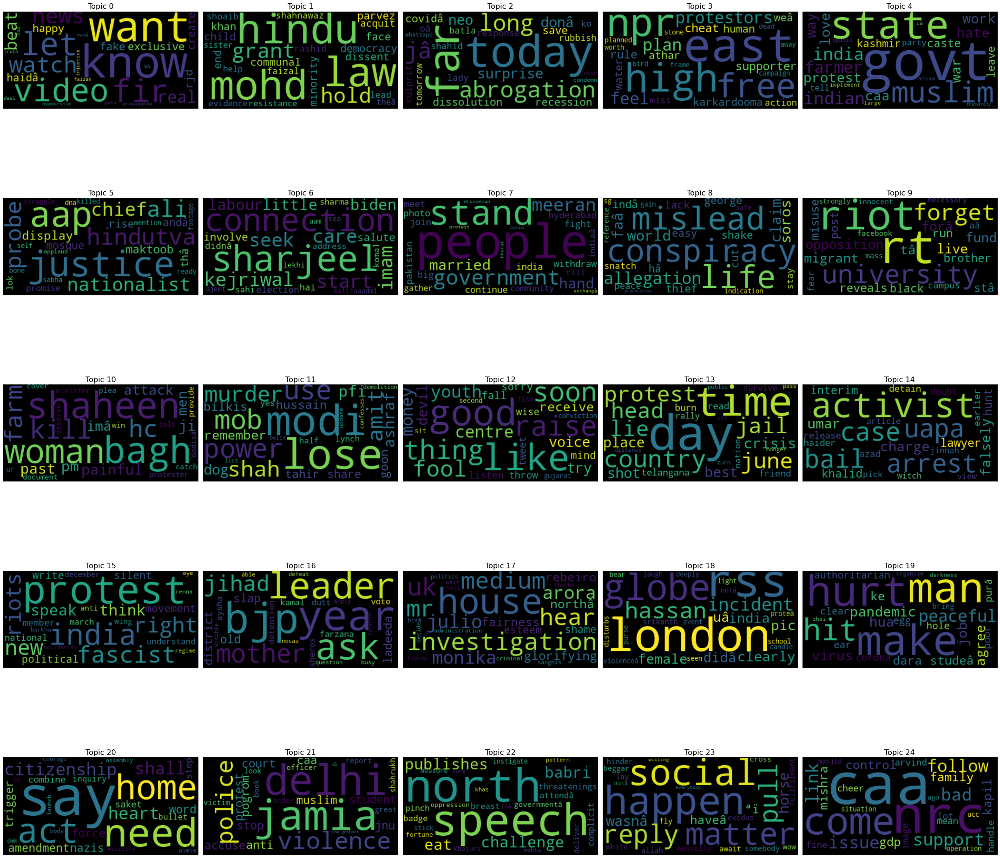

In [55]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud
nltk.download('stopwords')
from nltk.corpus import stopwords
STOPWORDS = ['i', "of", "the", "will", "https", "amp", "http", "a", "is", "in", "on", "it", "to", "that", "be", "not", 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', 'too', 'very', 's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', 've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn', "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn', "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", 'won', "won't", 'wouldn', "wouldn't"]
stopwords = set(STOPWORDS)
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stopwords,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=25,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

#topics1 = lda_H.show_topics(formatted=False)

fig, axes = plt.subplots(5, 5, figsize=(30,30), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    #topic_words = dict(topics[0][1])
    #cloud.generate_from_frequencies(topic_words, max_font_size=300)
    wordcloud = WordCloud(stopwords=stopwords).generate(topics[i][1])
    plt.imshow(wordcloud, interpolation='bilinear')
    #plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [148]:
df=pd.DataFrame(sentences)

In [149]:
df

,0,1,2,3,4,5,6,7
0,police brutality anxiety despite odds stack pe...,None,None,None,None,None,None,None
1,still democracy update wikipedia page trial ru...,None,None,None,None,None,None,None
2,rt want see run naked across various universit...,None,None,None,None,None,None,None
3,collate thread plan protest january across ind...,None,None,None,None,None,None,None
4,tragic irony see india's student become unsusp...,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...
64407,jamia violence notice issue sharjeel imamâs ...,None,None,None,None,None,None,None
64408,rt sharjeel imam grant bail jamia violence cas...,None,None,None,None,None,None,None
64409,rt big breaking \n\nsharjeel imam also get bai...,None,None,None,None,None,None,None
64410,rt jnu student get bail jamia violence case\n\...,None,None,None,None,None,None,None


In [229]:
# Create Dictionary
import gensim
import gensim.corpora as corpora
from gensim.corpora import Dictionary
textt = " ".join(tweet for tweet in meta_unique.cleaned_tweets)
id2word = corpora.Dictionary(words_by_sentence)

# Create Corpus: Term Document Frequency
corpus = [id2word.doc2bow(text) for text in words_by_sentence]


#(25, max_iter=100, # first parameter # OF TOPICS, YOU DECIDE
                                #learning_method='online', learning_offset=50.,random_state=0

In [231]:
#sentences1

In [239]:
# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100, #offset=100, 
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           iterations=100,
                                           per_word_topics=True)



In [240]:
print(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0, '0.782*"protest" + 0.171*"today" + 0.000*"riot" + 0.000*"big" + 0.000*"cover" + 0.000*"farmer" + 0.000*"survive" + 0.000*"rohingyas" + 0.000*"irony" + 0.000*"student"'), (1, '0.259*"act" + 0.175*"citizenship" + 0.137*"amendment" + 0.108*"hold" + 0.000*"also" + 0.000*"islamist" + 0.000*"sahi" + 0.000*"glorify" + 0.000*"student" + 0.000*"official"'), (2, '0.437*"democracy" + 0.162*"never" + 0.106*"free" + 0.076*"the" + 0.023*"would" + 0.018*"keep" + 0.018*"lead" + 0.012*"within" + 0.006*"hour" + 0.004*"miss"'), (3, '0.476*"people" + 0.343*"want" + 0.046*"go" + 0.005*"let" + 0.000*"forget" + 0.000*"doctor" + 0.000*"believe" + 0.000*"cannot" + 0.000*"cheer" + 0.000*"farm"'), (4, '0.420*"day" + 0.218*"since" + 0.190*"present" + 0.030*"assam" + 0.029*"please" + 0.013*"watch" + 0.009*"protester" + 0.006*"is" + 0.003*"brave" + 0.001*"reject"'), (5, '0.574*"india" + 0.161*"kill" + 0.052*"post" + 0.021*"silent" + 0.005*"care" + 0.000*"call" + 0.000*"ð\x9f\x91\x89" + 0.000*"student" + 0.000*

In [241]:
from gensim.models import CoherenceModel
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  
# a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=words_by_sentence, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -23.126478267369233

Coherence Score:  0.3383643413323816


In [242]:
listshist=list(lda_model.print_topics())

In [282]:
listshist.sort()
listshist[0][1]

#7
#12
#19
#21
#22
#23

'0.782*"protest" + 0.171*"today" + 0.000*"riot" + 0.000*"big" + 0.000*"cover" + 0.000*"farmer" + 0.000*"survive" + 0.000*"rohingyas" + 0.000*"irony" + 0.000*"student"'

In [250]:
words_by_sentence
data_flat2=[]
for w_list in words_by_sentence:
    for word in w_list:
        data_flat2.append(word)

In [251]:
data_flat2

['police',
 'brutality',
 'anxiety',
 'despite',
 'odds',
 'stack',
 'people',
 'continue',
 'resist',
 'watch',
 'story',
 'time',
 'time',
 'still',
 'democracy',
 'update',
 'wikipedia',
 'page',
 'trial',
 'run',
 'simulate',
 'modishah',
 'world',
 'rt',
 'want',
 'see',
 'run',
 'naked',
 'across',
 'various',
 'university',
 'campus',
 'ð\x9f\x98\x82ð\x9f\x98\x82ð\x9f\x98\x82',
 'collate',
 'thread',
 'plan',
 'protest',
 'january',
 'across',
 'india',
 'feel',
 'free',
 'add',
 'reply',
 'come',
 'across',
 'miss',
 'protests',
 'tragic',
 'irony',
 'see',
 'indias',
 'student',
 'become',
 'unsuspecting',
 'pawns',
 'game',
 'intellectual',
 'terrorism',
 'via',
 'social',
 'disruption',
 'perverse',
 'way',
 'pseudo',
 'amp',
 'celebs',
 'validate',
 'jade',
 'existence',
 'pension',
 'stopped',
 'thats',
 'people',
 'apt',
 'reply',
 'matter',
 'exodus',
 'kashmiri',
 'pandits',
 'happen',
 'full',
 'might',
 'india',
 'watch',
 'happen',
 'post',
 'protest',
 'caa',
 'care

C:\Users\anush\AppData\Local\Temp/ipykernel_12648/2161421940.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')


IndexError: list index out of range

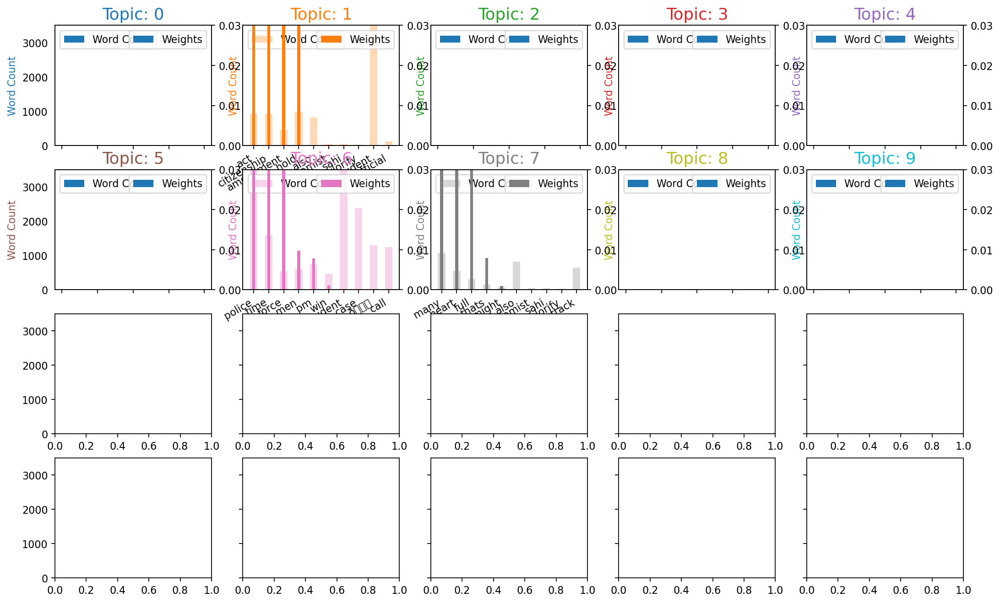

In [289]:
#Not working -- COME BACK TO THIS
from collections import Counter
topics = lda_model.show_topics(formatted=False)
#data_flat = [w for w_list in words_by_sentence for w in w_list]
counter = Counter(data_flat2)

out1 = []
for i, topic in topics:
    for word, weight in topic:
        out1.append([word, i , weight, counter[word]])

df = pd.DataFrame(out1, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(4, 5, figsize=(16,10), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

#fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=22, y=1.05)    
plt.show()

In [259]:
len(out)

100

In [275]:
df.query('topic_id==6')

,word,topic_id,importance,word_count
50,police,6,0.597591,5866
51,time,6,0.213622,1589
52,force,6,0.106124,530
53,men,6,0.009745,608
54,pm,6,0.007743,740
55,win,6,0.001038,453
56,student,6,0.000003,4644
57,case,6,0.000003,2381
58,ð,6,0.000003,1296
59,call,6,0.000003,1246


In [286]:
# Sentence Coloring of N Sentences
def topics_per_document(model, corpus, start=0, end=1):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    for i, corp in enumerate(corpus_sel):
        topic_percs, wordid_topics, wordid_phivalues = model[corp]
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse=True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
    return(dominant_topics, topic_percentages)

dominant_topics, topic_percentages = topics_per_document(model=lda_model, corpus=corpus, end=-1)            

# Distribution of Dominant Topics in Each Document
df = pd.DataFrame(dominant_topics, columns=['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name='count').reset_index()

# Total Topic Distribution by actual weight
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name='count').reset_index()

# Top 3 Keywords for each Topic
topic_top3words = [(i, topic) for i, topics in lda_model.show_topics(formatted=False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns=['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(', \n'.join)
df_top3words.reset_index(level=0,inplace=True)

In [292]:
from matplotlib.ticker import FuncFormatter

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), dpi=120, sharey=True)

# Topic Distribution by Dominant Topics
ax1.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc, width=.5, color='firebrick')
ax1.set_xticks(range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))
tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(x)+ '\n' + df_top3words.loc[df_top3words.topic_id==x, 'words'].values[0])
ax1.xaxis.set_major_formatter(tick_formatter)
ax1.set_title('Number of Documents by Dominant Topic', fontdict=dict(size=10))
ax1.set_ylabel('Number of Documents')
ax1.set_ylim(0, 1000)

# Topic Distribution by Topic Weights
ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc, width=.5, color='steelblue')
ax2.set_xticks(range(df_topic_weightage_by_doc.index.unique().__len__()))
ax2.xaxis.set_major_formatter(tick_formatter)
ax2.set_title('Number of Documents by Topic Weightage', fontdict=dict(size=10))

plt.show()

IndexError: index 0 is out of bounds for axis 0 with size 0

<Figure size 1200x480 with 2 Axes>

In [299]:
!pip install pyLDAvis

import pyLDAvis
import pyLDAvis.gensim_models
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary=lda_model.id2word)
vis

D:\ANACONDA\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
16    -0.342795  0.370230       1        1  32.713579
17    -0.178221 -0.201434       2        1  10.679378
15    -0.112279 -0.074857       3        1   7.881367
13    -0.140885 -0.115158       4        1   7.503663
6     -0.102250 -0.064886       5        1   5.274129
0     -0.154759 -0.141252       6        1   3.634041
14    -0.058124 -0.028684       7        1   3.311700
12     0.017922  0.007405       8        1   3.213567
9      0.085354  0.024987       9        1   3.008278
2      0.029053  0.010974      10        1   2.919981
8      0.065351  0.020739      11        1   2.866626
4     -0.061328 -0.030909      12        1   2.760381
3      0.026387  0.009882      13        1   2.708701
5      0.088267  0.025495      14        1   2.301526
19     0.049884  0.016717      15        1   2.081591
10     0.170295  0.035251      16        1   1.890078
11     0.140481  0.033121      17        1   1.760906
18     0.133638  0.032394      18        1   1.432639
1      0.155680  0.034403      19        1   1.163317
7      0.188328  0.035583      20        1   0.894552, topic_info=         Term          Freq         Total Category  logprob  loglift
188     delhi  58526.000000  58526.000000  Default  30.0000  30.0000
25         rt  83416.000000  83416.000000  Default  29.0000  29.0000
987     jamia  62059.000000  62059.000000  Default  28.0000  28.0000
194  violence  59268.000000  59268.000000  Default  27.0000  27.0000
76        caa  24137.000000  24137.000000  Default  26.0000  26.0000
..        ...           ...           ...      ...      ...      ...
673    muslim      0.134356      2.393498  Topic20 -10.6857   1.8366
777      jail      0.134353      2.393458  Topic20 -10.6857   1.8366
58    student      0.134369      2.403045  Topic20 -10.6856   1.8327
649      riot      0.134356      2.397416  Topic20 -10.6857   1.8349
947      case      0.134356      2.398732  Topic20 -10.6857   1.8344

[802 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
240      19  0.998846        act
420       8  0.996983     action
31       10  0.956360        add
363       3  0.959387      alone
241      19  0.997988  amendment
...     ...       ...        ...
534      11  0.997016    without
470      17  0.991481      woman
21        2  0.995329      world
175      10  0.993812      would
341      17  0.981536      young

[167 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[17, 18, 16, 14, 7, 1, 15, 13, 10, 3, 9, 5, 4, 6, 20, 11, 12, 19, 2, 8])

In [301]:
!pip install pyLDAvis

import pyLDAvis
import pyLDAvis.gensim_models
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda tf_vectorizer)
vis

AttributeError: 'numpy.ndarray' object has no attribute 'tocsc'

In [30]:
#use this link to build a foundation for sentiment classification as negative and positive: https://towardsdatascience.com/a-beginners-guide-to-sentiment-analysis-in-python-95e354ea84f6
#emotional recognition method: https://github.com/nikicc/twitter-emotion-recognition

[nltk_data] Error loading stopwords: <urlopen error [WinError 10060] A
[nltk_data]     connection attempt failed because the connected party
[nltk_data]     did not properly respond after a period of time, or
[nltk_data]     established connection failed because connected host
[nltk_data]     has failed to respond>


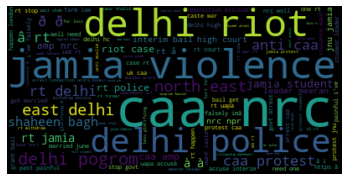

In [74]:
#wordcloud
#trying wordcloud
import matplotlib.pyplot as plt
from wordcloud import WordCloud
nltk.download('stopwords')
from nltk.corpus import stopwords
# Create stopword list:
STOPWORDS = ['i', "of", "the", "will", "a", "is", "in", "on", "it", "to", "that", "be", "not", 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', 'too', 'very', 's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', 've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn', "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn', "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", 'won', "won't", 'wouldn', "wouldn't"]
stopwords = set(STOPWORDS)
#stopwords.update(["br", "href"])

textt = " ".join(tweet for tweet in meta_unique.cleaned_tweets)
wordcloud = WordCloud(stopwords=stopwords).generate(textt)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.savefig('wordcloud_thesis.png')
plt.show()

In [75]:
#Use this for cleaning and MORE: https://github.com/leowgriffin/tweets_analysis_hkprotests_2019/blob/master/sahkprotests_analysis.ipynb

In [84]:
#SENTIMENT ANALYSIS
#Importing VADER from NLTK
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Create a sid object called SentimentIntensityAnalyzer()
sid = SentimentIntensityAnalyzer()

# Apply polarity_score method of SentimentIntensityAnalyzer()
meta_unique['sentiment'] = meta_unique['cleaned_tweets'].apply(lambda x: sid.polarity_scores(x))

# Keep only the compound scores under the column 'Sentiment'
meta_unique = pd.concat([meta_unique.drop(['sentiment'], axis = 1), meta_unique['sentiment'].apply(pd.Series)], axis = 1)

C:\Users\anush\AppData\Local\Temp/ipykernel_4940/4029774077.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta_unique['sentiment'] = meta_unique['cleaned_tweets'].apply(lambda x: sid.polarity_scores(x))


In [85]:
meta_unique.head()

,author id,created_at,geo,id,lang,like_count,quote_count,reply_count,retweet_count,source,tweet,mentioned_users,cleaned_tweets,neg,neu,pos,compound
0,66334416,2020-01-10 23:59:38+00:00,317fcc4b21a604d5,1215785300032573440,en,4,1,0,2,Twitter for Android,"Police brutality in UP, anxiety in #ShaheenBag...",[@CNNnews18],police brutality anxiety despite odds stack pe...,0.341,0.659,0.000,-0.6908
1,750559263270047744,2020-01-10 23:31:58+00:00,,1215778338729578502,en,0,0,0,0,Twitter for Android,Are we still a democracy? Or should we update ...,[],still democracy update wikipedia page trial ru...,0.000,1.000,0.000,0.0000
2,731912700805189632,2020-01-10 22:53:27+00:00,,1215768644761935872,en,0,0,0,0,Twitter for Android,RT if you want to see @anuragkashyap72 running...,[@anuragkashyap72],rt want see run naked across various universit...,0.000,0.874,0.126,0.0772
3,1213642463404949504,2020-01-10 22:32:07+00:00,,1215763276442865667,en,0,0,0,0,Twitter for iPhone,Here is the collated thread of planned protest...,[],collate thread plan protest january across ind...,0.278,0.556,0.167,-0.0516
4,918506117491314688,2020-01-10 21:42:29+00:00,,1215750785117483014,en,0,0,0,0,Twitter for Android,A tragic irony to see India's students become ...,"[@smritiirani, @narendramodi]",tragic irony see india's student become unsusp...,0.404,0.430,0.166,-0.8074


In [86]:
# Focus on 'compound' scores
# Create a new column called 'sentiment_class'
sentimentclass_list = []
for i in range(0, len(meta_unique)):
    
    # current 'compound' score:
    curr_compound = meta_unique.iloc[i,:]['compound']
    
    if (curr_compound <= 1.0 and curr_compound >= 0.55):
        sentimentclass_list.append(5)
    elif (curr_compound < 0.55 and curr_compound >= 0.10):
        sentimentclass_list.append(4)
    elif (curr_compound < 0.10 and curr_compound > -0.10):
        sentimentclass_list.append(3)
    elif (curr_compound <= -0.10 and curr_compound > -0.55):
        sentimentclass_list.append(2)
    elif (curr_compound <= -0.55 and curr_compound >= -1.00):
        sentimentclass_list.append(1)
# Add the new column 'sentiment_class' to the dataframe
meta_unique['sentiment_class'] = sentimentclass_list
# Verify if the classification assignment is correct:
meta_unique.iloc[0:5, :][['compound', 'sentiment_class']]

,compound,sentiment_class
0,-0.6908,1
1,0.0000,3
2,0.0772,3
3,-0.0516,3
4,-0.8074,1


D:\ANACONDA\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


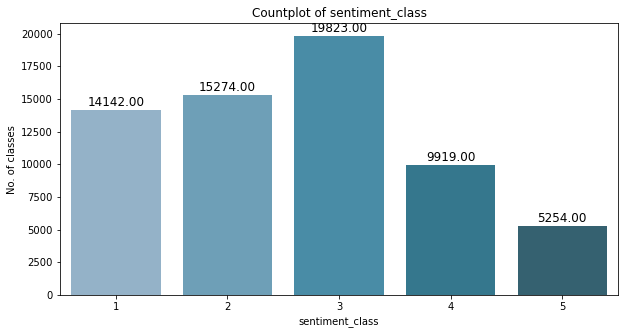

In [192]:
import seaborn as sns
# Distribution of sentiment_class
plt.figure(figsize = (10,5))
sns.set_palette('PuBuGn_d')

plots=sns.countplot(meta_unique['sentiment_class'])

# Iterating over the bars one-by-one
for bar in plots.patches:
   
  # Using Matplotlib's annotate function and
  # passing the coordinates where the annotation shall be done
  # x-coordinate: bar.get_x() + bar.get_width() / 2
  # y-coordinate: bar.get_height()
  # free space to be left to make graph pleasing: (0, 8)
  # ha and va stand for the horizontal and vertical alignment
    plots.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=12, xytext=(0, 8),
                   textcoords='offset points')

plt.title('Countplot of sentiment_class')
plt.xlabel('sentiment_class')
plt.ylabel('No. of classes')
plt.show()

In [193]:
len(meta_unique)

64412

In [97]:
# Display full text in Jupyter notebook:
pd.set_option('display.max_colwidth', -1)
# Look at some examples of negative, neutral and positive tweets
# Filter negative original poems:
print("30 random negative original tweets and their sentiment classes:")
meta_unique[(meta_unique['sentiment_class'] == 1) | (meta_unique['sentiment_class'] == 2)].sample(n=50)[['tweet', 'sentiment_class']]

30 random negative original tweets and their sentiment classes:


C:\Users\anush\AppData\Local\Temp/ipykernel_4940/3430714764.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,tweet,sentiment_class
4924,"To pull the chestnuts out of the fire for somebody , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia",2
714,All Islamist #CAAProtests . You let Hindus persecuted in one country and protest not to let them let Inn in another countries .. Rot in hell https://t.co/XKI3Mfb9Sd,1
48681,"RT @MJALSHRIKA: You will hear a similar news sooner than later. Those human rights violators, oppressors and usurpers who think their accouâ¦",2
7538,"Give a fool rope enough , and he will hang himself #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia",2
2012,Cc @rsprasad what are we waiting for .. another riots like #caaprotests in the name of \n #farmersrprotest https://t.co/aL5B1UJWcU,2
5981,"He should have a long spoon that sups with the devil , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia",1
18102,"Company in distress makes trouble less , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia",1
26472,RT @ladeedafarzana: The police in Telangana are hunting students from Hyderabad University because of the anti-CAA protests. 14 students haâ¦,2
21710,"The remedy is worse than the disease , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia #WorldAgainstNewIndianCitizenshipLaw",2
59893,RT @LiveLawIndia: Jamia Violence: hearing on petitions seeking independent inquiry begins before the Delhi HC\n\n@DelhiPolice #JamiaViolenceâ¦,1


In [95]:
# Display full text in Jupyter notebook:
pd.set_option('display.max_colwidth', -1)
# Look at some examples of negative, neutral and positive tweets
# Filter negative original poems:
print("30 random neutral original tweets and their sentiment classes:")
meta_unique[(meta_unique['sentiment_class'] == 3)].sample(n=30)[['tweet', 'sentiment_class']]

30 random neutral original tweets and their sentiment classes:


C:\Users\anush\AppData\Local\Temp/ipykernel_4940/1920136412.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,tweet,sentiment_class
13464,"In every beginning think of the end , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia #WorldAgainstNewIndianCitizenshipLaw",3
32483,RT @mkvenu1: Earlier opposition was misleading people against CAA/NRC combine. Now PM says opposition is misleading farmers over the new faâ¦,3
39924,"RT @AbdurRahman_IPS: Y'day addressed #ShaheenBagh of\nUdgir in Latur\nNanded, place of my district training &amp;\nUmarkhed in Yavatmal where I seâ¦",3
27096,RT @AxomBhumiputro: à¦à¦£ à¦¹à§à¦à¦à¦¾à§° \n \n12/12/2020\nLocation: Guwahati (near Martyr Sam Stafford's residence)\n#AssamAgainstCAA\n#AssamRejectsCAA \n#Câ¦,3
13523,"Life is not all cakes and ale (beer and skittles) , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia",3
4807,RT @mudrashirvaikar: Alternate account of current events in India for #HarryPotter dummies. #IndiaAgainstCAA #NoCAA #NoNRC\n\nCopyright: Warnâ¦,3
2369,"RT @Satyaawachan: And, these people will teach others 9n nationalism, patriotism etc?ð¤\n\n#JNUKaSachUnmasked\n#NRC_CAA_Protest\n#IndiaAgainstCAâ¦",3
4755,"Crows do not pick crow's eyes , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia #WorldAgainstNewIndianCitizenshipLaw",3
14172,Jantar Mantar in Delhi | UNESCO World Heritage Centre India\n#jantarmantar #indiaagainstcaa #nrc #indiaagainstcab #shaheenbaghprotest #chowkidarchorhai #sosjamia #sosjnu #shaheenbagh #ravishkumar #jnusu #jnuattack #ravishkumarndtv #india\nhttps://t.co/0On6qDLnJ4 https://t.co/gEnXiDkd99,3
29583,RT @aisa_du: AISA - DU held it's 16th Unit Conference where Com. @SwaliPrakash and Com. @RitwikR80620022 were elected as President &amp; Secretâ¦,3


In [98]:
# Display full text in Jupyter notebook:
pd.set_option('display.max_colwidth', -1)
# Look at some examples of negative, neutral and positive tweets
# Filter negative original poems:
print("30 random positive original tweets and their sentiment classes:")
meta_unique[(meta_unique['sentiment_class'] == 4) | (meta_unique['sentiment_class'] == 5)].sample(n=50)[['tweet', 'sentiment_class']]

30 random positive original tweets and their sentiment classes:


C:\Users\anush\AppData\Local\Temp/ipykernel_4940/3964216111.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,tweet,sentiment_class
53439,RT @BawaNaaved: #ShahrukhPathan is a victim of hypocrisy within the society. Not only the #BJP and the media did their best to defame him aâ¦,4
23180,"A clean hand wants no washing , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia #WorldAgainstNewIndianCitizenshipLaw",5
13366,"Self done is well done , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia #WorldAgainstNewIndianCitizenshipLaw",4
35368,"DISPATCHES | The #Telangana govt contends that these orgs allure people into their fold with inflammatory statements, meetings &amp; rallies and by highlighting various issues such as the #UAPA Act, the #farmlaws, CAA/NRC.\n\nReport by @ravishant.\n\nhttps://t.co/dgw6apKvxg",4
4952,"Be slow to promise and quick to perform , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia",4
20181,"Best defense is offense , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia #WorldAgainstNewIndianCitizenshipLaw",5
4294,@IndiaAgainstCAA sure,4
33370,"RT @roshovani: This is happening in London!! \nDoes UK has CAA, NRC? Well they need one...\nhttps://t.co/fGYaOYZBOk",4
23892,"RT @SitaramYechury: Amit Shah has outlined the âchronologyâ clearly, not once, twice but umpteen times. Now, such comments being made to miâ¦",4
3037,@ABPNews @kumarprakash4u @ArvindKejriwal @AamAadmiParty #freebijlipani ka chakkar mey @BJP4India Lut gayee and @INCIndia vanished #IndiaSupportsCAA n #IndiaAgainstCAA_NPR_NRC not cared #Hinduism #DelhiResults on free factor. ð,5


In [148]:
# Train word2vec using CBOW
#create a model with gensim.models.Word2Vec, add parameters
#removed batch_words from this

import gensim
model = gensim.models.Word2Vec(words_by_sentence, window=5, min_count=2, sg=0, alpha=0.025)

In [149]:
#textt

In [158]:
#get an array of similarity scores in relation to 'caa'
#remember to mention words in lowercase because tokenization has removed uppercase

model.wv['caa']

array([ 0.93969864,  0.9465132 , -0.657827  , -1.3652647 ,  1.60731   ,
       -0.5412966 , -1.1827478 ,  0.93024707, -0.00632623,  0.12807277,
       -1.3254846 ,  0.04323697, -1.729162  ,  0.8557511 , -0.5151462 ,
       -1.713564  ,  0.9790389 , -0.01021016, -1.0501717 , -1.5141145 ,
       -0.695296  ,  0.3963288 , -0.8142326 , -2.896081  ,  0.2402965 ,
       -1.6630759 ,  1.6050786 ,  1.3522288 , -1.2091501 ,  1.0024574 ,
       -0.6875928 , -0.34139764, -1.783791  , -0.87797695,  0.68862647,
       -0.22760007,  0.1720927 ,  0.27233607,  0.92454845, -0.98133606,
       -1.3074907 ,  1.5652046 ,  1.0137353 , -1.7437663 ,  0.793793  ,
        0.5076898 , -0.9297221 ,  0.86635005,  1.6647234 , -1.4448637 ,
       -0.17891726, -2.2632084 ,  0.00830739,  0.7193219 , -0.54584885,
        0.9841751 ,  2.1170208 ,  0.51215816, -0.21863568,  0.42313972,
        2.125009  ,  0.36912233,  1.6559441 ,  0.8024204 , -0.6119316 ,
        2.2716453 , -1.0357841 , -0.01424136,  0.10796802, -0.14

In [159]:
model.wv.similarity('caa', 'support'), model.wv.similarity('caa', 'mob'), model.wv.similarity('caa', 'violence') 
#the hindu-muslim comparison just shows it works because they are both religion-linked

(0.3912969, 0.037211493, 0.3284386)

In [162]:
# Most similar terms

#top number of words similar to these
model.wv.most_similar(positive=['caa', 'protest'], topn=25)
                                                

[('fasâ\x80¦', 0.7238079905509949),
 ('protesters', 0.6787989735603333),
 ('movementâ\x80¦', 0.6773814558982849),
 ('coâ\x80¦', 0.673326849937439),
 ('maha', 0.6718149781227112),
 ('rohingyas', 0.6715140342712402),
 ('protestors', 0.6661196947097778),
 ('rally', 0.6621454954147339),
 ('kerala', 0.661011815071106),
 ('violent', 0.6598793864250183),
 ('participate', 0.6584771275520325),
 ('part', 0.6553727984428406),
 ('delâ\x80¦', 0.6551251411437988),
 ('governmâ\x80¦', 0.6543814539909363),
 ('agitation', 0.6534355282783508),
 ('attacks', 0.6461543440818787),
 ('ampâ\x80¦', 0.6457897424697876),
 ('unconstitutional', 0.6450230479240417),
 ('rioâ\x80¦', 0.6432334780693054),
 ('conspiriâ\x80¦', 0.6425045132637024),
 ('mumbaibagh', 0.6378508806228638),
 ('rejecteâ\x80¦', 0.6369255185127258),
 ('lakh', 0.6325911283493042),
 ('amid', 0.6315585374832153),
 ('farmer', 0.6309603452682495)]

In [163]:
# Most similar terms

#top number of words similar to these
model.wv.most_similar(positive=['caa', 'nrc'], topn=50)
                                                    

[('coâ\x80¦', 0.742122232913971),
 ('covid', 0.7404385209083557),
 ('migration', 0.7360657453536987),
 ('rejecteâ\x80¦', 0.7321376204490662),
 ('unconstitutional', 0.7314037680625916),
 ('nrccaa', 0.7269639372825623),
 ('nationwide', 0.7165590524673462),
 ('organize', 0.7143413424491882),
 ('puâ\x80¦', 0.7128644585609436),
 ('violent', 0.7112407684326172),
 ('barrister', 0.7101240754127502),
 ('part', 0.709735631942749),
 ('yesterday', 0.7054136395454407),
 ('neet', 0.6963393688201904),
 ('kerala', 0.6934441328048706),
 ('lockdown', 0.6933192610740662),
 ('census', 0.6920323967933655),
 ('kasaragod', 0.6917715072631836),
 ('rohingyas', 0.6904754042625427),
 ('aadhaar', 0.6870718598365784),
 ('nric', 0.6839612722396851),
 ('demonetisation', 0.6838778853416443),
 ('lakh', 0.6824558973312378),
 ('aasu', 0.6814683079719543),
 ('article', 0.6787227392196655),
 ('pandemic', 0.6783239245414734),
 ('gst', 0.6756120920181274),
 ('thread', 0.6754283308982849),
 ('participate', 0.6738128066062927

In [ ]:
#Top N Tweets
# It turns out that some of the entries of 'retweetcount' is either in str or int
# We convert the data type of the column to all int using pd.to_numeric()
print('Current data type of "retweetcount" is:',meta_unique['retweetcount'].dtypes)
data['retweetcount'] = pd.to_numeric(arg = data['retweetcount'])
print('Current data type of "retweetcount" is:',data['retweetcount'].dtypes)

In [164]:
from nltk import word_tokenize
from nltk.stem.snowball import SnowballStemmer
import requests

In [165]:
!pip install -U LeXmo
from LeXmo import LeXmo

In [166]:
#https://betterprogramming.pub/unlocking-emotions-in-text-using-python-6d062b48d71f
emo=LeXmo.LeXmo(textt)

In [183]:
emo

{'text': 'police brutality anxiety despite odds stack people continue resist watch story time time still democracy update wikipedia page trial run simulate modi-shah world?\n rt want see run naked across various university campus \nð\x9f\x98\x82ð\x9f\x98\x82ð\x9f\x98\x82\n\n collate thread plan protest january across india feel free add reply come across miss protests.\n\n tragic irony see india\'s student become unsuspecting pawns game intellectual terrorism via social disruption perverse way pseudo amp celebs validate jade existence pension stopped?\n\n_\n\n that\'s people\n\n \n\n apt reply matter exodus kashmiri pandits happen full might india watch happen post protest caa care \n\n detainee chennai continue protest hold community hall caa force give date.\n\n one month anti-caa protest assam give birth new political alternative everyone stndng govt say betterment country people majority part roads stop egoistic ban kanhaiya kumar answer almost question ask bjp leader able answer s

In [184]:
#now visualization
emotions = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'negative', 'positive', 'sadness', 'surprise', 'trust'] 
degrees = [0.04323976790226178, 0.036615469206611496, 0.017958627952678594, 0.0537231496983864, 0.02041982983960004, 0.07224034829206845, 0.05138413513918446, 0.032402915622377154, 0.016306189806376725, 0.041882615797948705]
#Now GRAPH this shit

#Limitations of sentiment analysis in tweets and poems: the positivity or negativity could be about the government, i.e. status quo or the protesters
#but in this case, the wordcloud shows words used in relation positively to protesters

In [185]:
import matplotlib.pyplot as plt

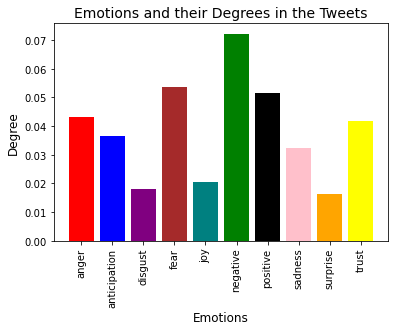

In [186]:
colors = ['red', 'blue', 'purple', 'brown', 'teal', 'green', 'black', 'pink', 'orange', 'yellow']
plt.bar(emotions, degrees, color=colors)
plt.title('Emotions and their Degrees in the Tweets', fontsize=14)
plt.xlabel('Emotions', fontsize=12)
plt.ylabel('Degree', fontsize=12)
# changing the rc parameters and plotting a line plot
plt.xticks(rotation=90)
plt.figure
#plt.rcParams['figure.figsize'] = [5, 5]
#plt.figure(figsize=(20, 20))
plt.show()

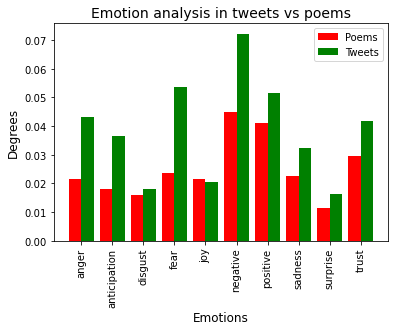

In [191]:
#comparative visualization
import numpy as np 
#import matplotlib.pyplot as plt 
  
X = ['anger', 'anticipation', 'disgust', 'fear', 'joy', 'negative', 'positive', 'sadness', 'surprise', 'trust']
YPoems = [0.021596606247589665, 0.018125723100655612, 0.01600462784419591, 0.023717701504049362, 0.021596606247589665, 0.04492865406864636, 0.04107211723871963, 0.022560740455071344, 0.011376783648283841, 0.029695333590435788]
ZTweets = [0.04323976790226178, 0.036615469206611496, 0.017958627952678594, 0.0537231496983864, 0.02041982983960004, 0.07224034829206845, 0.05138413513918446, 0.032402915622377154, 0.016306189806376725, 0.041882615797948705]
  
X_axis = np.arange(len(X))
  
plt.bar(X_axis - 0.2, YPoems, 0.4, label = 'Poems', color = 'r')
plt.bar(X_axis + 0.2, ZTweets, 0.4, label = 'Tweets', color = 'g')
  
plt.xticks(X_axis, X)
plt.xticks(rotation=90)
plt.xlabel("Emotions", fontsize=12)
plt.ylabel("Degrees", fontsize=12)
plt.title("Emotion analysis in tweets vs poems", fontsize=14)
plt.legend()
plt.show()

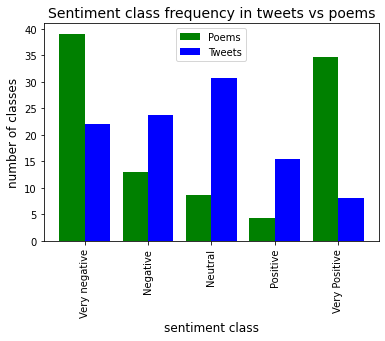

In [209]:
#comparative barplot of frequency of sentiment classes for poems vs tweets

#comparative visualization
import numpy as np 
#import matplotlib.pyplot as plt 
  
X = ['Very negative', 'Negative', 'Neutral', 'Positive', 'Very Positive']
YPoems = [(9/23)*100, (3/23)*100, (2/23)*100, (1/23)*100, (8/23)*100]
ZTweets = [(14142/64412)*100, (15274/64412)*100, (19823/64412)*100, (9919/64412)*100, (5254/64412)*100]

X_axis = np.arange(len(X))
  
plt.bar(X_axis - 0.2, YPoems, 0.4, label = 'Poems', color = 'g')
plt.bar(X_axis + 0.2, ZTweets, 0.4, label = 'Tweets', color = 'b')

plt.xticks(X_axis, X)
plt.xticks(rotation=90)
plt.xlabel("sentiment class", fontsize=12)
plt.ylabel("number of classes", fontsize=12)
plt.title("Sentiment class frequency in tweets vs poems", fontsize=14)
plt.legend()
plt.show()

#have to annotate this



In [210]:
# Convert the data type of the column to all int using pd.to_numeric()
print('Current data type of "retweet count" is:',meta_unique['retweet_count'].dtypes)
meta_unique['retweet_count'] = pd.to_numeric(arg = meta_unique['retweet_count'])
print('Current data type of "retweet count" is:',meta_unique['retweet_count'].dtypes)

Current data type of "retweet count" is: object
Current data type of "retweet count" is: int64


In [219]:
def alltime_top_tweets(df, N):
    # Arguments:
    # df - dataframe
    # N - top N tweets based on retweetcount
    
    # Sort according to 'retweetcount'
    top_tweets_df = df.sort_values(by = ['retweet_count'], ascending = False)
    # Drop also duplicates from the list, keep only the copy with higher retweetcount
    top_tweets_df.drop_duplicates(subset = 'tweet', keep = 'first', inplace = True)
    # Keep only N rows
    top_tweets_df = top_tweets_df.head(N)
    
    # Print out only important details 
    # username, tweetcreatedts, retweetcount, original text 'text'
    return top_tweets_df[['retweet_count', 'tweet', 'cleaned_tweets']]
print('All-time top 20 tweets:')
print('\n')
alltime_top_tweets(meta_unique, 20)

All-time top 20 tweets:




,retweet_count,tweet,cleaned_tweets
29864,14903,RT @hasanminhaj: #CAA + #NRC + more this Sunday on @patriotact https://t.co/AIoAub8Fwu,rt sunday
28712,9006,RT @ndtv: Woman protester breaks down while speaking to NDTV's Ravish Kumar at Delhi's #ShaheenBagh\n\n#CAA #NRC https://t.co/4TizzqCYNN,rt woman protester break speak ndtv's ravish kumar delhi's \n\n
28882,8464,RT @kpnewschannel: My House was burnt \nMy documents were burnt \nMy Family was killed \nMy Childhood was ruined \nMy Identity was lost \nI am aâ¦,rt house burn \nmy document burn \nmy family kill \nmy childhood ruin \nmy identity lose \ni aâ¦
30936,8357,"RT @ShashiTharoor: I donât know who this brilliant poet is, but âhum kagaz nahin dikhayengeâ is destined to be one of the most powerful antâ¦",rt donât know brilliant poet âhum kagaz nahin dikhayengeâ destine one powerful antâ¦
32084,7320,RT @asadowaisi: Speechless to hear the news of @rahatindori's passing away. This is a personal loss. May Allah grant him maghfirah &amp; illumiâ¦,rt speechless hear news pass away personal loss may allah grant maghfirah amp illumiâ¦
58466,6876,RT @vemula_radhika: My son Rohith was martyred in struggle for inclusive education. He was vilified &amp; hounded. Today I am enraged to see siâ¦,rt son rohith martyr struggle inclusive education vilify amp hound today enrage see siâ¦
36663,6339,RT @knowthenation: This young NRI student started out with a deep dive into morals and the need to fight for the thought of India.\n\nWhen asâ¦,rt young nri student start deep dive moral need fight think india.\n\nwhen asâ¦
39195,6275,"RT @vivekagnihotri: I am surprised that not even one journalist has asked from where #ShaheenBaghProtests are getting wireless sets, metalâ¦",rt surprise even one journalist ask get wireless set metalâ¦
62553,6185,RT @karthiksubbaraj: Citizenship Amendment Act - Sounds seriously wrong &amp; against Secularism..\n\nLet's keep India Secular \nSay NO to CAA\nSaâ¦,rt citizenship amendment act sound seriously wrong amp secularism..\n\nlet's keep india secular \nsay caa\nsaâ¦
55586,6150,RT @akshaylakra17: His name is Bharat Sharma. Law student of du. State executive committee member of ABVP. Volunteer of Rss\nClearly seen kiâ¦,rt name bharat sharma law student du state executive committee member abvp volunteer rss\nclearly see kiâ¦


In [218]:
def alltime_least_tweets(df, N):
    # Arguments:
    # df - dataframe
    # N - top N tweets based on retweetcount
    
    # Sort according to 'retweetcount'
    least_tweets_df = df.sort_values(by = ['retweet_count'], ascending = True)
    # Drop also duplicates from the list, keep only the copy with higher retweetcount
    least_tweets_df.drop_duplicates(subset = 'tweet', keep = 'first', inplace = True)
    # Keep only N rows
    least_tweets_df = least_tweets_df.head(N)
    
    # Print out only important details 
    # username, tweetcreatedts, retweetcount, original text 'text'
    return least_tweets_df[['retweet_count', 'tweet', 'cleaned_tweets']]
print('All-time least popular 20 tweets:')
print('\n')
alltime_least_tweets(meta_unique, 20)

All-time least popular 20 tweets:




,retweet_count,tweet,cleaned_tweets
19703,0,"One today is worth two tomorrow , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia #WorldAgainstNewIndianCitizenshipLaw",one today worth two tomorrow
19374,0,"Scornful dogs will eat dirty puddings , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia",scornful dog eat dirty pudding
19373,0,"Easier said than done , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia #WorldAgainstNewIndianCitizenshipLaw",easy say do
19372,0,"A blind man would be glad to see , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia #WorldAgainstNewIndianCitizenshipLaw",blind man would glad see
19371,0,"It is the first step that costs , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia #WorldAgainstNewIndianCitizenshipLaw",first step cost
19370,0,"Better be born lucky than rich , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia #WorldAgainstNewIndianCitizenshipLaw",well bear lucky rich
19369,0,"It is easy to swim if another holds up your chin (head) , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia",easy swim another hold chin head
19368,0,"If there were no clouds , we should not enjoy the sun #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia",cloud enjoy sun
19367,0,"Fasting comes after feasting , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia #WorldAgainstNewIndianCitizenshipLaw",fast come feast
19366,0,"Beggars cannot be choosers , #WorldAgainstCAA_NRC_NPR #IndiaAgainstCAA_NRC_NPR #SaveConstitutionSaveIndia #WeThePeopleOfIndia #WorldAgainstNewIndianCitizenshipLaw",beggar cannot chooser


In [ ]:
data_cleantest = outpath + 'clean_test.csv'

#get data read and drop any empty row

Hashtag_meta = pd.read_csv(data_cleantest, encoding='latin1')

In [ ]:

#Hashtag_meta.drop([0,1],axis=0,inplace=True)
Hashtag_meta1 = Hashtag_meta.reset_index()
Hashtag_meta1.head()
#Report_Card.drop([5,11,17],axis=0,inplace=True)
#Hashtag_meta1 = Hashtag_meta.dropna(axis=0, subset=['tweet'])

In [ ]:
Hashtag_meta1.drop(columns = ['geo', 'lang', 'source', 'reply_count', 'id', 'author id'])

In [ ]:
#Now do this for other keywords
#Figure how to add them to same database = see farmers protest code
